# SWB Mood Bandpow Regressions
- MODEL COMPARISON WITH MAIN NOTEBOOK

*Created:* 10/05/2024 \
*Updated:* 11/19/2024 


In [2]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp, pearsonr, spearmanr
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy
import random
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.regression.mixed_linear_model import MixedLM 
from joblib import Parallel, delayed
import pickle
import itertools
import time 
from matplotlib.ticker import StrMethodFormatter
import sys


import warnings
warnings.filterwarnings('ignore')




In [3]:
# Specify root directory for un-archived data and results 
base_dir   = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/'
anat_dir   = f'{base_dir}recon_labels/'
neural_dir = f'{base_dir}data/'
behav_dir  = f'{base_dir}behav/'
save_dir   = f'{base_dir}results/mood_results/'

os.makedirs(save_dir,exist_ok=True)

date = datetime.date.today().strftime('%m%d%Y')
print(date)

11202024


In [4]:
%load_ext autoreload
%autoreload 2


sys.path.append(f'{base_dir}LFPAnalysis/')

from LFPAnalysis import analysis_utils

script_dir = '/hpc/users/finka03/swb_ephys_analysis/scripts/'
sys.path.append(f'{script_dir}analysis_notebooks/')

from ieeg_tools import *
from plot_tools import *

sys.path.append(f'{script_dir}behav/')

from behav_utils import *
from swb_subj_behav import *

In [5]:
subj_ids = list(pd.read_excel(f'{base_dir}subj_info/SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[0]).PatientID)
n_subj = len(subj_ids)
# subj_ids


In [6]:

#### set theme for all plots
# %matplotlib inline
# from matplotlib import rc
# rc('text', usetex=False)

# sns.set_theme(style='ticks') 
# sns.set_context("talk")

# from matplotlib.colors import ListedColormap,LinearSegmentedColormap
# import matplotlib as mpl
# from matplotlib import cm


# # saez_cmap colors = org,yellow, sagegreen, darker green, blue, purple 

# # 671351
# saez_colors    = ['#ffb243','#FCE27C','#6a9752','#1d5d2a','#00467e','#561C46']
# saez_hex_cmap  = ListedColormap(saez_colors)
# saez_rgb       = [mpl.colors.to_rgb(hex) for hex in saez_colors]
# saez_full_cmap = LinearSegmentedColormap.from_list('saez_full_cmap',saez_rgb,N=10)
# #plot_palette = saez_linear_cmap.resampled(lutsize=30)
# expanded_cmap  = [mpl.colors.rgb2hex(saez_full_cmap(c)[:3]) for c in range(saez_full_cmap.N)]


In [101]:
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# temp_behav,beh_drops = format_all_behav(raw_behav,return_drops=True,norm=False)

# beh_drops
# all_orthog_rpe  = []
# all_rpe_cpe_rsq = []
# behav_list = []

# for ix, subj_id in enumerate(subj_ids): 
# #     subj_df = raw_behav[ix]
#     subj_df = temp_behav[temp_behav.subj_id==subj_id].reset_index(drop=True)
#     # find indices where cpe is not nan
#     notnan_idx = [ix for ix,cpe in enumerate(subj_df.cpe) if not np.isnan(cpe)]
#     # initialize save vector
#     subj_df['orthog_rpe'] = np.nan
#     # run ols regression rpe ~ cpe
#     rpe_cpe = sm.OLS(subj_df.rpe,sm.add_constant(subj_df.cpe),missing='drop').fit()
#     all_rpe_cpe_rsq.append(rpe_cpe.rsquared)
#     subj_df['orthog_rpe'][notnan_idx] = rpe_cpe.resid
#     all_orthog_rpe.extend(subj_df['orthog_rpe'])
#     behav_list.append(subj_df)
#     # del rpe_cpe 
    
# # all_behav['orthog_rpe'] = all_orthog_rpe

# all_behav,beh_drops = format_all_behav(behav_list,return_drops=True,norm=True)



In [8]:
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# all_behav,beh_drops = format_all_behav(raw_behav,return_drops=True)
# del raw_behav
# # beh_drops
# raw_behav = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_task_df.csv') for subj_id in subj_ids]
# all_behav,beh_drops = format_all_behav(raw_behav,return_drops=True)

# raw_mood = [pd.read_csv(f'{behav_dir}behav_data/{subj_id}_mood_df.csv') for subj_id in subj_ids]
# all_mood, mood_drops = format_all_mood(raw_mood, all_behav, return_drops=True, drop_bads=False)


# Load Mood Epochs dfs

In [85]:
band = 'beta'

mood_pow_df = pd.read_csv(f'{save_dir}regression_dfs/{band}_mood_epochs_df.csv')
# mood_pow_df.head()
mood_pow_df

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cf_t3,cpe_t1,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,norm_mood,roi,hemi,unique_reref_ch
0,0,0,-0.5,20.743342,lacas1-lacas2,-0.166469,beta,MS002,14,low,...,0.759848,1.461373,-0.892581,-0.795008,5.310698,545.592613,0.277664,acc,l,MS002_lacas1-lacas2
1,1,1,-0.5,20.743342,lacas1-lacas2,0.013476,beta,MS002,14,low,...,-0.920262,1.241834,0.802754,0.875934,3.432630,577.049490,0.277664,acc,l,MS002_lacas1-lacas2
2,2,2,-0.5,20.743342,lacas1-lacas2,-0.045186,beta,MS002,14,low,...,-0.674991,-1.441430,0.266101,-1.185300,3.599831,609.642231,0.134538,acc,l,MS002_lacas1-lacas2
3,3,3,-0.5,20.743342,lacas1-lacas2,-0.215742,beta,MS002,14,low,...,0.428731,-1.197497,0.680788,-0.465698,3.984104,643.713750,0.420789,acc,l,MS002_lacas1-lacas2
4,4,4,-0.5,20.743342,lacas1-lacas2,-0.054737,beta,MS002,14,low,...,0.060824,1.729700,-0.831598,-0.831598,4.350371,677.264040,0.420789,acc,l,MS002_lacas1-lacas2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93995,93995,45,-0.5,20.743342,rvmot6-rvmot7,0.504584,beta,DA039,22,high,...,0.915739,NaN,0.314126,-0.772921,2.773696,2180.513505,-0.524890,motor,r,DA039_rvmot6-rvmot7
93996,93996,46,-0.5,20.743342,rvmot6-rvmot7,-0.334335,beta,DA039,22,high,...,-0.014353,-0.652138,1.835992,-0.289789,3.061470,2215.197736,-0.524890,motor,r,DA039_rvmot6-rvmot7
93997,93997,47,-0.5,20.743342,rvmot6-rvmot7,-0.164107,beta,DA039,22,high,...,NaN,1.111294,1.884306,NaN,3.447751,2251.180979,0.330135,motor,r,DA039_rvmot6-rvmot7
93998,93998,48,-0.5,20.743342,rvmot6-rvmot7,0.066859,beta,DA039,22,high,...,0.760724,1.763523,1.497800,-0.652138,4.503968,2282.349445,1.441667,motor,r,DA039_rvmot6-rvmot7


In [86]:
np.sum(mood_pow_df.keep_mood=='drop')

2362

In [87]:
mood_pow_df= mood_pow_df[mood_pow_df.keep_mood=='keep'].reset_index(drop=True)
mood_pow_df

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cf_t3,cpe_t1,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,norm_mood,roi,hemi,unique_reref_ch
0,0,0,-0.5,20.743342,lacas1-lacas2,-0.166469,beta,MS002,14,low,...,0.759848,1.461373,-0.892581,-0.795008,5.310698,545.592613,0.277664,acc,l,MS002_lacas1-lacas2
1,1,1,-0.5,20.743342,lacas1-lacas2,0.013476,beta,MS002,14,low,...,-0.920262,1.241834,0.802754,0.875934,3.432630,577.049490,0.277664,acc,l,MS002_lacas1-lacas2
2,2,2,-0.5,20.743342,lacas1-lacas2,-0.045186,beta,MS002,14,low,...,-0.674991,-1.441430,0.266101,-1.185300,3.599831,609.642231,0.134538,acc,l,MS002_lacas1-lacas2
3,3,3,-0.5,20.743342,lacas1-lacas2,-0.215742,beta,MS002,14,low,...,0.428731,-1.197497,0.680788,-0.465698,3.984104,643.713750,0.420789,acc,l,MS002_lacas1-lacas2
4,4,4,-0.5,20.743342,lacas1-lacas2,-0.054737,beta,MS002,14,low,...,0.060824,1.729700,-0.831598,-0.831598,4.350371,677.264040,0.420789,acc,l,MS002_lacas1-lacas2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91633,93995,45,-0.5,20.743342,rvmot6-rvmot7,0.504584,beta,DA039,22,high,...,0.915739,NaN,0.314126,-0.772921,2.773696,2180.513505,-0.524890,motor,r,DA039_rvmot6-rvmot7
91634,93996,46,-0.5,20.743342,rvmot6-rvmot7,-0.334335,beta,DA039,22,high,...,-0.014353,-0.652138,1.835992,-0.289789,3.061470,2215.197736,-0.524890,motor,r,DA039_rvmot6-rvmot7
91635,93997,47,-0.5,20.743342,rvmot6-rvmot7,-0.164107,beta,DA039,22,high,...,NaN,1.111294,1.884306,NaN,3.447751,2251.180979,0.330135,motor,r,DA039_rvmot6-rvmot7
91636,93998,48,-0.5,20.743342,rvmot6-rvmot7,0.066859,beta,DA039,22,high,...,0.760724,1.763523,1.497800,-0.652138,4.503968,2282.349445,1.441667,motor,r,DA039_rvmot6-rvmot7


In [88]:
keep_rois = ['dlpfc','vlpfc','dmpfc','ofc','ains','acc','amy','hpc']     
mood_pow_df = mood_pow_df[mood_pow_df.roi.isin(keep_rois)]


In [89]:
mood_pow_df = mood_pow_df.reset_index(drop=True)

# Electrode-wise Regressions

In [90]:
mood_pow_df

,Unnamed: 0,epoch,time,freq,reref_ch_names,band_pow,band,subj_id,bdi,bdi_thresh,...,cf_t3,cpe_t1,cpe_t2,cpe_t3,mood_epoch_len,next_round_start,norm_mood,roi,hemi,unique_reref_ch
0,0,0,-0.5,20.743342,lacas1-lacas2,-0.166469,beta,MS002,14,low,...,0.759848,1.461373,-0.892581,-0.795008,5.310698,545.592613,0.277664,acc,l,MS002_lacas1-lacas2
1,1,1,-0.5,20.743342,lacas1-lacas2,0.013476,beta,MS002,14,low,...,-0.920262,1.241834,0.802754,0.875934,3.432630,577.049490,0.277664,acc,l,MS002_lacas1-lacas2
2,2,2,-0.5,20.743342,lacas1-lacas2,-0.045186,beta,MS002,14,low,...,-0.674991,-1.441430,0.266101,-1.185300,3.599831,609.642231,0.134538,acc,l,MS002_lacas1-lacas2
3,3,3,-0.5,20.743342,lacas1-lacas2,-0.215742,beta,MS002,14,low,...,0.428731,-1.197497,0.680788,-0.465698,3.984104,643.713750,0.420789,acc,l,MS002_lacas1-lacas2
4,4,4,-0.5,20.743342,lacas1-lacas2,-0.054737,beta,MS002,14,low,...,0.060824,1.729700,-0.831598,-0.831598,4.350371,677.264040,0.420789,acc,l,MS002_lacas1-lacas2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55288,93945,45,-0.5,20.743342,rsgcc7-rsgcc8,-0.222338,beta,DA039,22,high,...,0.915739,NaN,0.314126,-0.772921,2.773696,2180.513505,-0.524890,vlpfc,r,DA039_rsgcc7-rsgcc8
55289,93946,46,-0.5,20.743342,rsgcc7-rsgcc8,-0.263717,beta,DA039,22,high,...,-0.014353,-0.652138,1.835992,-0.289789,3.061470,2215.197736,-0.524890,vlpfc,r,DA039_rsgcc7-rsgcc8
55290,93947,47,-0.5,20.743342,rsgcc7-rsgcc8,0.207840,beta,DA039,22,high,...,NaN,1.111294,1.884306,NaN,3.447751,2251.180979,0.330135,vlpfc,r,DA039_rsgcc7-rsgcc8
55291,93948,48,-0.5,20.743342,rsgcc7-rsgcc8,0.808338,beta,DA039,22,high,...,0.760724,1.763523,1.497800,-0.652138,4.503968,2282.349445,1.441667,vlpfc,r,DA039_rsgcc7-rsgcc8


In [91]:
# # # define interaction vector
# # mood_pow_df['mood_cpe_int'] = np.multiply(mood_pow_df['norm_mood'],mood_pow_df['cpe_t1'])
# mood_pow_df['pow_cpe_int']  = np.multiply(mood_pow_df['band_pow'],mood_pow_df['cpe_t1'])
# mood_pow_df['pow_rpe_int']  = np.multiply(mood_pow_df['band_pow'],mood_pow_df['rpe_t1'])

# # remove nans and null values from df 
mood_pow_df = mood_pow_df[~mood_pow_df.norm_mood.isnull()]
# # mood_pow_df = mood_pow_df[~mood_pow_df.TrialEV_t1.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.cpe_t1.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.rpe_t1.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.Profit_t1.isnull()]
mood_pow_df = mood_pow_df[~mood_pow_df.band_pow.isnull()]
mood_pow_df = mood_pow_df.reset_index(drop=True)
# # mood_pow_df = mood_pow_df[~mood_pow_df.mood_cpe_int.isnull()]
# # mood_pow_df = mood_pow_df[~mood_pow_df.pow_cpe_int.isnull()]


In [95]:
elec_col    = 'unique_reref_ch'

# reg_formula = 'band_pow~norm_mood+cpe_t1+mood_cpe_int'
# reg_formula = 'band_pow~norm_mood+TrialEV_t1+Profit_t1+rpe_t1+cpe_t1+mood_cpe_int'

# reg_formula = 'norm_mood~band_pow+cpe_t1+pow_cpe_int'
# reg_formula = 'norm_mood~band_pow+rpe_t1+cpe_t1+pow_rpe_int+pow_cpe_int'
reg_formula = 'norm_mood~band_pow+Profit_t1+rpe_t1+cpe_t1'
n_permutations = 1000


In [100]:
results_dict = run_individual_elec_regression(mood_pow_df,reg_formula,elec_col,n_permutations)


Permutations: 100%|██████████| 1000/1000 [00:00<00:00, 4772.09it/s]


In [56]:
results_dict['MS002_lacas1-lacas2']

,Original_Estimate,Permuted_Mean,Permuted_Std,Z_Score,P_Value
Intercept,0.013736,-0.000131,0.030363,0.456725,0.647869
band_pow,-0.086205,-0.013106,0.592577,-0.123359,0.901823
rpe_t1,0.014149,0.000901,0.189442,0.069932,0.944248
cpe_t1,0.029906,-0.008596,0.180027,0.213868,0.830650
pow_rpe_int,-2.394405,-0.056946,1.077608,-2.169118,0.030074
pow_cpe_int,0.255791,0.010244,0.675190,0.363672,0.716103


In [57]:
save_vars = results_dict['MS002_lacas1-lacas2'].index.tolist()
save_vars


['Intercept', 'band_pow', 'rpe_t1', 'cpe_t1', 'pow_rpe_int', 'pow_cpe_int']

In [58]:
results = single_elec_permutation_results(results_dict,mood_pow_df,save_vars)
results



,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_band_pow,Original_Estimate_rpe_t1,Original_Estimate_cpe_t1,Original_Estimate_pow_rpe_int,Original_Estimate_pow_cpe_int,...,Z_Score_rpe_t1,Z_Score_cpe_t1,Z_Score_pow_rpe_int,Z_Score_pow_cpe_int,P_Value_Intercept,P_Value_band_pow,P_Value_rpe_t1,P_Value_cpe_t1,P_Value_pow_rpe_int,P_Value_pow_cpe_int
0,MS002_lacas1-lacas2,MS002,acc,14,0.013736,-0.086205,0.014149,0.029906,-2.394405,0.255791,...,0.069932,0.213868,-2.169118,0.363672,0.647869,0.901823,0.944248,0.830650,0.030074,0.716103
1,MS002_lacas2-lacas3,MS002,acc,14,0.032595,0.517625,0.239460,0.130213,-0.164991,0.682902,...,1.240853,0.657329,-0.181921,0.696532,0.118496,0.425577,0.214660,0.510969,0.855645,0.486096
2,MS002_lacas3-lacas4,MS002,acc,14,0.034596,0.060021,0.406343,0.000775,2.248021,-1.161590,...,2.427196,-0.015240,2.512725,-1.252082,0.038572,0.923693,0.015216,0.987840,0.011980,0.210540
3,MS002_lacas4-lacas5,MS002,acc,14,0.057628,0.423657,0.231146,0.011053,-0.413126,-0.095787,...,1.315239,0.074671,-0.846149,-0.117971,0.252836,0.522368,0.188430,0.940477,0.397470,0.906091
4,MS002_lacas5-lacas6,MS002,acc,14,0.100628,1.732773,0.352339,0.007277,0.885523,-0.178036,...,2.174319,0.040140,0.911453,-0.218192,0.014479,0.026049,0.029681,0.967981,0.362057,0.827280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
987,DA039_rof9-rof10,DA039,dlpfc,22,0.103310,0.691684,-0.241721,0.629178,-0.446591,-0.742948,...,-0.711347,1.863289,-0.144253,-0.297987,0.598141,0.673695,0.476869,0.062422,0.885301,0.765713
988,DA039_rof10-rof11,DA039,dlpfc,22,0.026669,-0.352502,-0.101114,0.794758,2.053707,-0.856684,...,-0.204635,2.092308,0.845427,-0.507453,0.946313,0.811442,0.837858,0.036411,0.397872,0.611837
989,DA039_rof11-rof12,DA039,dlpfc,22,-0.162562,-4.352303,-0.046951,0.794463,7.264761,-4.813554,...,-0.092312,1.672840,0.683981,-0.720334,0.633234,0.526324,0.926450,0.094359,0.493987,0.471319
990,DA039_rsgcc6-rsgcc7,DA039,vlpfc,22,-0.138426,-2.846187,-0.357762,0.734954,-3.873872,2.184051,...,-0.994857,1.787138,-1.802004,1.420997,0.086925,0.047162,0.319806,0.073915,0.071545,0.155318


In [59]:
results.columns



Index(['unique_elec_id', 'subj_id', 'roi', 'bdi',
       'Original_Estimate_Intercept', 'Original_Estimate_band_pow',
       'Original_Estimate_rpe_t1', 'Original_Estimate_cpe_t1',
       'Original_Estimate_pow_rpe_int', 'Original_Estimate_pow_cpe_int',
       'Permuted_Mean_Intercept', 'Permuted_Mean_band_pow',
       'Permuted_Mean_rpe_t1', 'Permuted_Mean_cpe_t1',
       'Permuted_Mean_pow_rpe_int', 'Permuted_Mean_pow_cpe_int',
       'Permuted_Std_Intercept', 'Permuted_Std_band_pow',
       'Permuted_Std_rpe_t1', 'Permuted_Std_cpe_t1',
       'Permuted_Std_pow_rpe_int', 'Permuted_Std_pow_cpe_int',
       'Z_Score_Intercept', 'Z_Score_band_pow', 'Z_Score_rpe_t1',
       'Z_Score_cpe_t1', 'Z_Score_pow_rpe_int', 'Z_Score_pow_cpe_int',
       'P_Value_Intercept', 'P_Value_band_pow', 'P_Value_rpe_t1',
       'P_Value_cpe_t1', 'P_Value_pow_rpe_int', 'P_Value_pow_cpe_int'],
      dtype='object')

### Save results as pickle file

In [131]:
# save_path = f'{save_dir}/{band}/'
# os.makedirs(save_path, exist_ok=True)

# fname = f'{save_path}{band}_perm_regression_results_{epoch_len}.pkl'
# pickle.dump(results, open(fname,"wb"))


### ROI Significance Testing
- % of sig elecs in ROI (also split by BDI)
- binomial test for whether sig proportion of elecs in ROI 
- ttests from zero 


In [60]:
# add mask col for sig cpe elecs 
results['cpe_t1_sig']      = results['P_Value_cpe_t1'].apply(lambda x: 0 if x > 0.05 else 1)
results['rpe_t1_sig']      = results['P_Value_rpe_t1'].apply(lambda x: 0 if x > 0.05 else 1)
# results['Profit_t1_sig']   = results['P_Value_Profit_t1'].apply(lambda x: 0 if x > 0.05 else 1)
# results['TrialEV_t1_sig']  = results['P_Value_TrialEV_t1'].apply(lambda x: 0 if x > 0.05 else 1)
results['band_pow_sig']    = results['P_Value_band_pow'].apply(lambda x: 0 if x > 0.05 else 1)
results['pow_rpe_int_sig'] = results['P_Value_pow_rpe_int'].apply(lambda x: 0 if x > 0.05 else 1)
results['pow_cpe_int_sig'] = results['P_Value_pow_cpe_int'].apply(lambda x: 0 if x > 0.05 else 1)

# results['mood_cpe_int_sig'] = results['P_Value_mood_cpe_int'].apply(lambda x: 0 if x > 0.05 else 1)

results['bdi_split']        = results['bdi'].apply(lambda x: 0 if x < 20 else 1)

results.head()

# results.to_csv(f'{save_path}{band}_perm_regression_results_df_{epoch_len}.csv')

,unique_elec_id,subj_id,roi,bdi,Original_Estimate_Intercept,Original_Estimate_band_pow,Original_Estimate_rpe_t1,Original_Estimate_cpe_t1,Original_Estimate_pow_rpe_int,Original_Estimate_pow_cpe_int,...,P_Value_rpe_t1,P_Value_cpe_t1,P_Value_pow_rpe_int,P_Value_pow_cpe_int,cpe_t1_sig,rpe_t1_sig,band_pow_sig,pow_rpe_int_sig,pow_cpe_int_sig,bdi_split
0,MS002_lacas1-lacas2,MS002,acc,14,0.013736,-0.086205,0.014149,0.029906,-2.394405,0.255791,...,0.944248,0.830650,0.030074,0.716103,0,0,0,1,0,0
1,MS002_lacas2-lacas3,MS002,acc,14,0.032595,0.517625,0.239460,0.130213,-0.164991,0.682902,...,0.214660,0.510969,0.855645,0.486096,0,0,0,0,0,0
2,MS002_lacas3-lacas4,MS002,acc,14,0.034596,0.060021,0.406343,0.000775,2.248021,-1.161590,...,0.015216,0.987840,0.011980,0.210540,0,1,0,1,0,0
3,MS002_lacas4-lacas5,MS002,acc,14,0.057628,0.423657,0.231146,0.011053,-0.413126,-0.095787,...,0.188430,0.940477,0.397470,0.906091,0,0,0,0,0,0
4,MS002_lacas5-lacas6,MS002,acc,14,0.100628,1.732773,0.352339,0.007277,0.885523,-0.178036,...,0.029681,0.967981,0.362057,0.827280,0,1,1,0,0,0


In [61]:
# reg_vars = ['Z_Score_band_pow','Z_Score_TrialEV_t1','Z_Score_Profit_t1','Z_Score_rpe_t1','Z_Score_cpe_t1','Z_Score_pow_cpe_int']
# reg_vars = ['Z_Score_band_pow','Z_Score_Profit_t1','Z_Score_rpe_t1','Z_Score_cpe_t1']
reg_vars = ['Z_Score_band_pow','Z_Score_rpe_t1','Z_Score_cpe_t1','Z_Score_pow_rpe_int','Z_Score_pow_cpe_int']


In [62]:
roi_sig_info = []
    
for roi in results.roi.unique().tolist():
    roi_results = results[results.roi==roi]
    roi_df = []
    for var in reg_vars:
        if (var == 'Z_Score_pow_cpe_int') | (var == 'Z_Score_pow_rpe_int'):
            var_sig = ('_').join([var.split('_')[-3],var.split('_')[-2],var.split('_')[-1],'sig'])
        else: 
            var_sig = ('_').join([var.split('_')[-2],var.split('_')[-1],'sig'])
        # ttest from zero 
        ttest_stat,ttest_pval = ttest_1samp(roi_results[var],popmean=0)
        # binomial test for significance 
        n = len(roi_results)
        x = np.sum(roi_results[var_sig])
        binom_test = scipy.stats.binomtest(x, n, p=0.05, alternative='greater')
        binom_pval = binom_test.pvalue
        binom_prop = binom_test.statistic
        ci_low     = binom_test.proportion_ci(confidence_level=0.95).low
        ci_high    = binom_test.proportion_ci(confidence_level=0.95).high
        
        # agg results 
        roi_df.append(pd.DataFrame({'roi':roi,'var_id':var,'n_total':n,'n_sig':x,'prop_sig':np.divide(x,n),
                                          'n_sig_highbdi':np.sum(roi_results[roi_results.bdi_split==1][var_sig]),
                                          'ttest_stat':ttest_stat,'ttest_pval':ttest_pval,
                                          'binom_ci_low':ci_low,'binom_ci_high':ci_high,
                                          'binom_prop':binom_prop,'binom_pval':np.round(binom_pval,4)},index=[0]))
    
    roi_df = pd.concat(roi_df).reset_index(drop=True)
    roi_sig_info.append(roi_df)

roi_sig_info = pd.concat(roi_sig_info).reset_index(drop=True)

In [63]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_band_pow']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
0,acc,Z_Score_band_pow,167,18,0.107784,5,0.893349,0.372964,0.070832,1.0,0.107784,0.0019
5,dmpfc,Z_Score_band_pow,193,22,0.113990,12,-1.739831,0.083491,0.078443,1.0,0.113990,0.0003
10,amy,Z_Score_band_pow,102,5,0.049020,1,1.485527,0.140519,0.019511,1.0,0.049020,0.5817
15,ains,Z_Score_band_pow,57,1,0.017544,0,0.581096,0.563507,0.000899,1.0,0.017544,0.9463
20,vlpfc,Z_Score_band_pow,75,5,0.066667,1,0.829158,0.409682,0.026634,1.0,0.066667,0.3211
25,hpc,Z_Score_band_pow,124,11,0.088710,2,-0.324318,0.746248,0.050546,1.0,0.088710,0.0469
30,ofc,Z_Score_band_pow,179,13,0.072626,4,0.756348,0.450441,0.043490,1.0,0.072626,0.1150
35,dlpfc,Z_Score_band_pow,95,12,0.126316,5,-2.462982,0.015599,0.074530,1.0,0.126316,0.0028


In [280]:
# roi_sig_info[roi_sig_info.var_id=='Z_Score_TrialEV_t1']

In [26]:
# roi_sig_info[roi_sig_info.var_id=='Z_Score_Profit_t1']

In [64]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_rpe_t1']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
1,acc,Z_Score_rpe_t1,167,9,0.053892,1,7.865311,4.463732e-13,0.028399,1.0,0.053892,0.4574
6,dmpfc,Z_Score_rpe_t1,193,8,0.041451,0,6.211337,3.186794e-09,0.020790,1.0,0.041451,0.7534
11,amy,Z_Score_rpe_t1,102,8,0.078431,0,4.159108,6.716553e-05,0.039624,1.0,0.078431,0.1387
16,ains,Z_Score_rpe_t1,57,4,0.070175,0,2.682484,9.587408e-03,0.024324,1.0,0.070175,0.3183
21,vlpfc,Z_Score_rpe_t1,75,5,0.066667,0,3.103144,2.711375e-03,0.026634,1.0,0.066667,0.3211
26,hpc,Z_Score_rpe_t1,124,13,0.104839,0,2.970845,3.572480e-03,0.063136,1.0,0.104839,0.0094
31,ofc,Z_Score_rpe_t1,179,10,0.055866,0,6.228092,3.306565e-09,0.030619,1.0,0.055866,0.4058
36,dlpfc,Z_Score_rpe_t1,95,1,0.010526,0,2.266237,2.573067e-02,0.000540,1.0,0.010526,0.9923


In [65]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_cpe_t1']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
2,acc,Z_Score_cpe_t1,167,26,0.155689,4,8.019591,1.812226e-13,0.111440,1.0,0.155689,0.0000
7,dmpfc,Z_Score_cpe_t1,193,20,0.103627,3,12.060504,2.677074e-25,0.069740,1.0,0.103627,0.0018
12,amy,Z_Score_cpe_t1,102,7,0.068627,3,8.291075,5.045164e-13,0.032650,1.0,0.068627,0.2491
17,ains,Z_Score_cpe_t1,57,5,0.087719,2,7.530935,4.588963e-10,0.035202,1.0,0.087719,0.1554
22,vlpfc,Z_Score_cpe_t1,75,14,0.186667,4,9.195808,7.105865e-14,0.116530,1.0,0.186667,0.0000
27,hpc,Z_Score_cpe_t1,124,7,0.056452,2,8.572396,3.575253e-14,0.026791,1.0,0.056452,0.4266
32,ofc,Z_Score_cpe_t1,179,29,0.162011,15,9.549621,1.042217e-17,0.118392,1.0,0.162011,0.0000
37,dlpfc,Z_Score_cpe_t1,95,11,0.115789,3,11.315644,3.054164e-19,0.066308,1.0,0.115789,0.0079


In [66]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_pow_rpe_int']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
3,acc,Z_Score_pow_rpe_int,167,6,0.035928,3,-0.993446,0.321939,0.015760,1.0,0.035928,0.8456
8,dmpfc,Z_Score_pow_rpe_int,193,13,0.067358,2,-0.765303,0.445031,0.040299,1.0,0.067358,0.1711
13,amy,Z_Score_pow_rpe_int,102,7,0.068627,1,-0.226371,0.821370,0.032650,1.0,0.068627,0.2491
18,ains,Z_Score_pow_rpe_int,57,3,0.052632,1,-0.397489,0.692518,0.014497,1.0,0.052632,0.5475
23,vlpfc,Z_Score_pow_rpe_int,75,7,0.093333,2,-1.333763,0.186372,0.044628,1.0,0.093333,0.0810
28,hpc,Z_Score_pow_rpe_int,124,8,0.064516,0,-2.652826,0.009035,0.032504,1.0,0.064516,0.2810
33,ofc,Z_Score_pow_rpe_int,179,12,0.067039,6,-0.796193,0.426980,0.039135,1.0,0.067039,0.1871
38,dlpfc,Z_Score_pow_rpe_int,95,5,0.052632,1,-0.261833,0.794023,0.020965,1.0,0.052632,0.5181


In [67]:
roi_sig_info[roi_sig_info.var_id=='Z_Score_pow_cpe_int']

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
4,acc,Z_Score_pow_cpe_int,167,6,0.035928,3,0.473386,0.636559,0.015760,1.0,0.035928,0.8456
9,dmpfc,Z_Score_pow_cpe_int,193,4,0.020725,1,1.350849,0.178334,0.007110,1.0,0.020725,0.9882
14,amy,Z_Score_pow_cpe_int,102,7,0.068627,1,-0.067988,0.945929,0.032650,1.0,0.068627,0.2491
19,ains,Z_Score_pow_cpe_int,57,2,0.035088,0,0.147913,0.882942,0.006270,1.0,0.035088,0.7851
24,vlpfc,Z_Score_pow_cpe_int,75,5,0.066667,2,2.475995,0.015573,0.026634,1.0,0.066667,0.3211
29,hpc,Z_Score_pow_cpe_int,124,6,0.048387,0,0.212259,0.832257,0.021280,1.0,0.048387,0.5907
34,ofc,Z_Score_pow_cpe_int,179,7,0.039106,6,0.543810,0.587253,0.018495,1.0,0.039106,0.7956
39,dlpfc,Z_Score_pow_cpe_int,95,3,0.031579,1,1.409059,0.162117,0.008662,1.0,0.031579,0.8595


In [68]:
sig_rois = roi_sig_info[roi_sig_info.binom_pval<0.05]
sig_rois

,roi,var_id,n_total,n_sig,prop_sig,n_sig_highbdi,ttest_stat,ttest_pval,binom_ci_low,binom_ci_high,binom_prop,binom_pval
0,acc,Z_Score_band_pow,167,18,0.107784,5,0.893349,3.729636e-01,0.070832,1.0,0.107784,0.0019
2,acc,Z_Score_cpe_t1,167,26,0.155689,4,8.019591,1.812226e-13,0.111440,1.0,0.155689,0.0000
5,dmpfc,Z_Score_band_pow,193,22,0.113990,12,-1.739831,8.349108e-02,0.078443,1.0,0.113990,0.0003
7,dmpfc,Z_Score_cpe_t1,193,20,0.103627,3,12.060504,2.677074e-25,0.069740,1.0,0.103627,0.0018
22,vlpfc,Z_Score_cpe_t1,75,14,0.186667,4,9.195808,7.105865e-14,0.116530,1.0,0.186667,0.0000
25,hpc,Z_Score_band_pow,124,11,0.088710,2,-0.324318,7.462482e-01,0.050546,1.0,0.088710,0.0469
26,hpc,Z_Score_rpe_t1,124,13,0.104839,0,2.970845,3.572480e-03,0.063136,1.0,0.104839,0.0094
32,ofc,Z_Score_cpe_t1,179,29,0.162011,15,9.549621,1.042217e-17,0.118392,1.0,0.162011,0.0000
35,dlpfc,Z_Score_band_pow,95,12,0.126316,5,-2.462982,1.559878e-02,0.074530,1.0,0.126316,0.0028
37,dlpfc,Z_Score_cpe_t1,95,11,0.115789,3,11.315644,3.054164e-19,0.066308,1.0,0.115789,0.0079


# Plot Results

In [286]:
# fig_save_path = f'{fig_dir}{band}/'
# os.makedirs(fig_save_path, exist_ok=True)

# fig_id = f'{band}_perm_regression_cpe_coeff_barplot_{epoch_len}.pdf'

# ylabel = fr'${band}_{{zpow}} \sim cpe$'


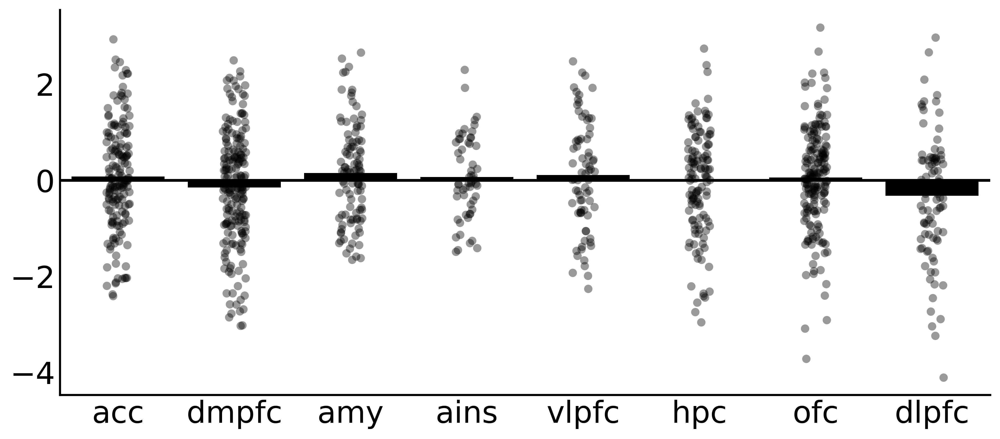

In [69]:
# plot_roi_model_results(results,'roi',cpe_var,bar_order=keep_rois,figsize=(12,5),color='k',
#                        ylabel=ylabel,save_fig=True,save_dir=fig_save_path,fig_id=fig_id,dpi=400)

plot_roi_model_results(results,'roi','Z_Score_band_pow',figsize=(12,5),color='k')



In [288]:
# plot_roi_model_results(results,'roi','Z_Score_TrialEV_t1',figsize=(12,5),color='k')


In [31]:
# plot_roi_model_results(results,'roi','Z_Score_Profit_t1',figsize=(12,5),color='k')


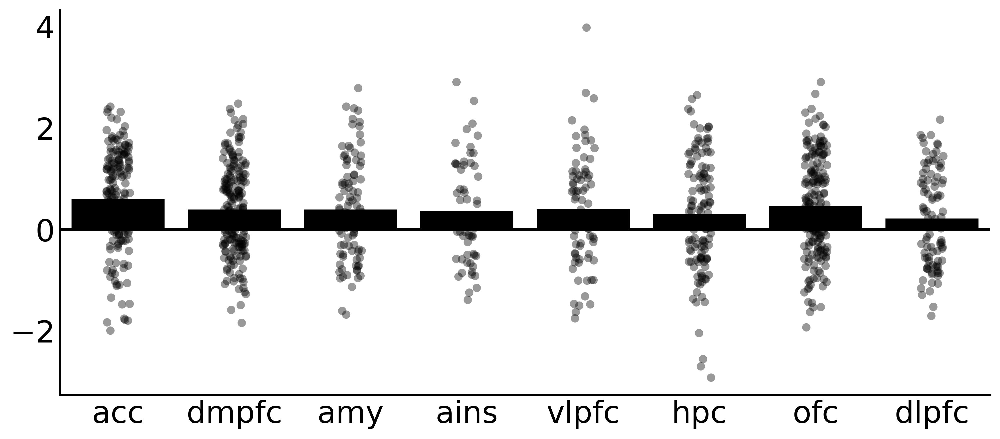

In [70]:
plot_roi_model_results(results,'roi','Z_Score_rpe_t1',figsize=(12,5),color='k')


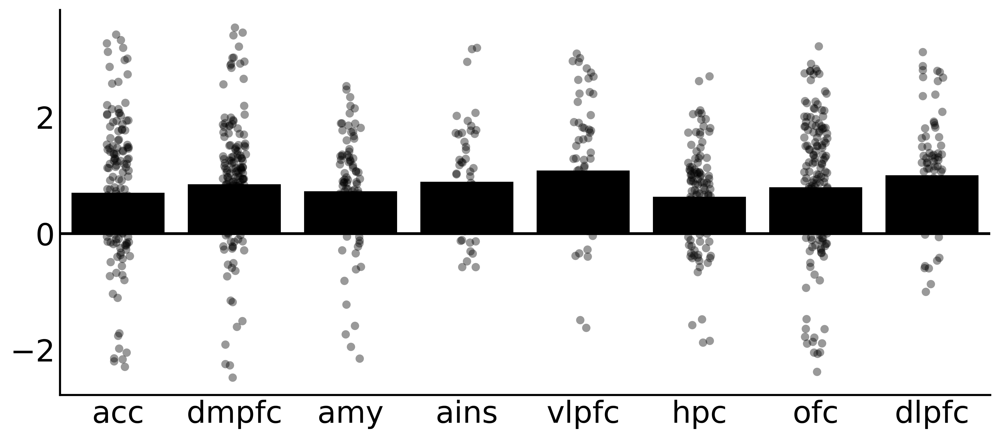

In [71]:
plot_roi_model_results(results,'roi','Z_Score_cpe_t1',figsize=(12,5),color='k')


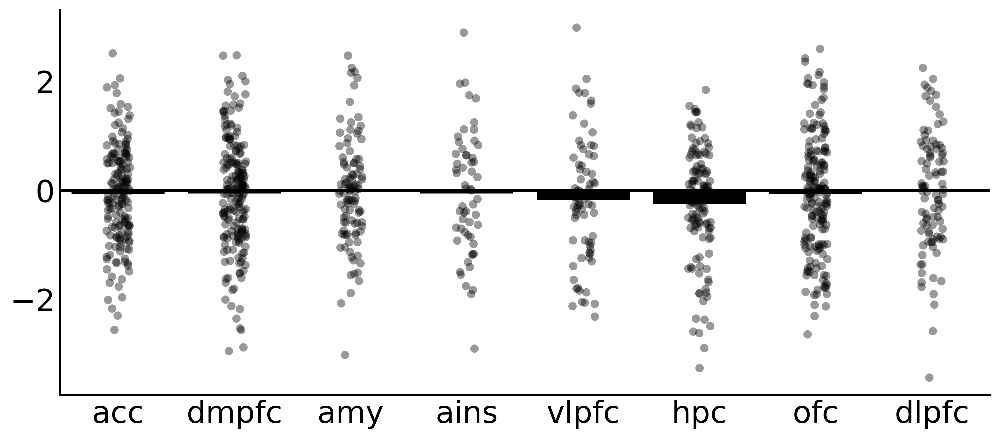

In [73]:
plot_roi_model_results(results,'roi','Z_Score_pow_rpe_int',figsize=(12,5),color='k')


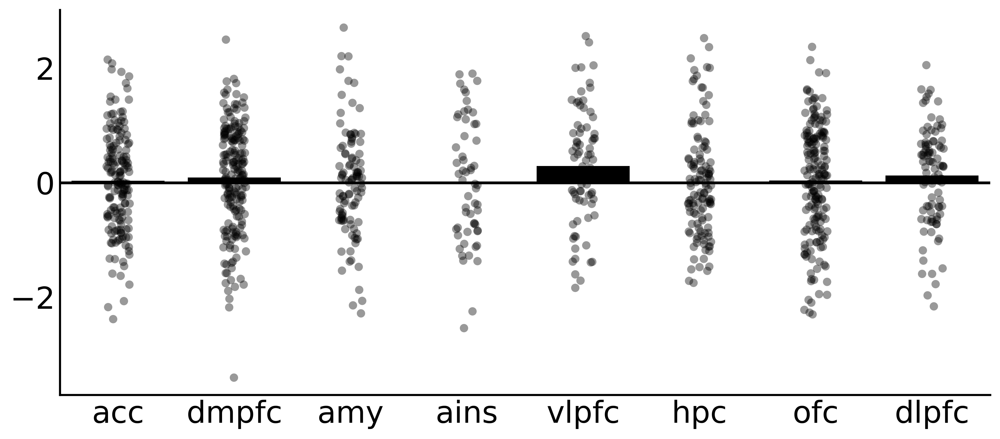

In [72]:
plot_roi_model_results(results,'roi','Z_Score_pow_cpe_int',figsize=(12,5),color='k')


## BDI correlations

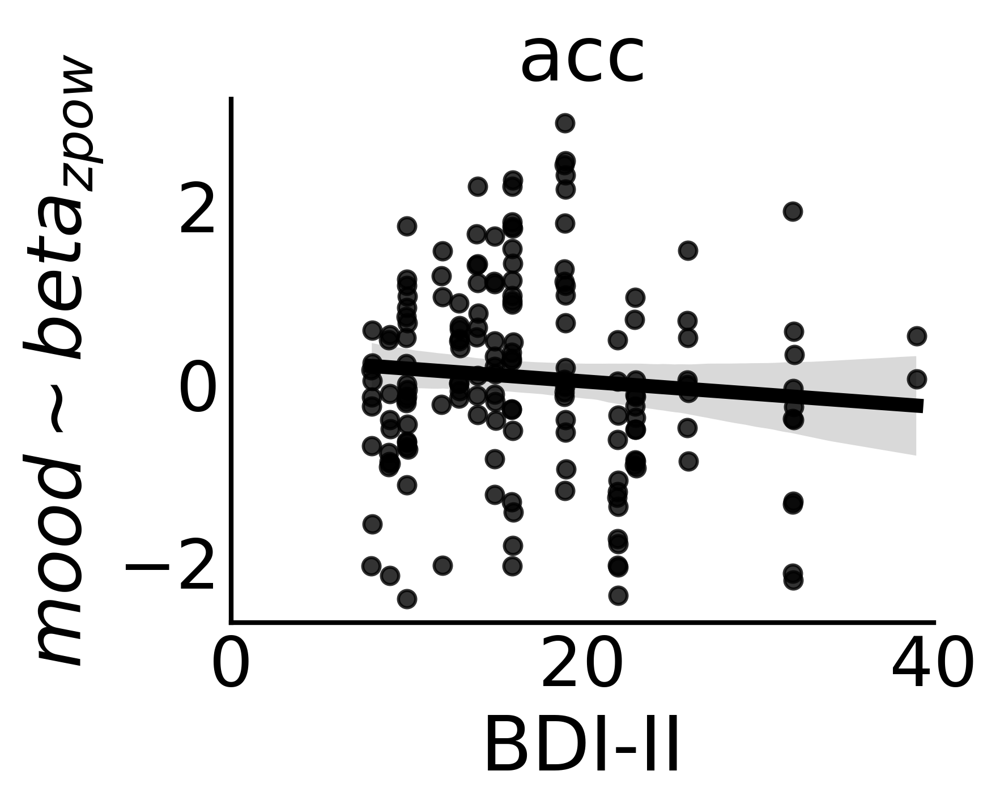

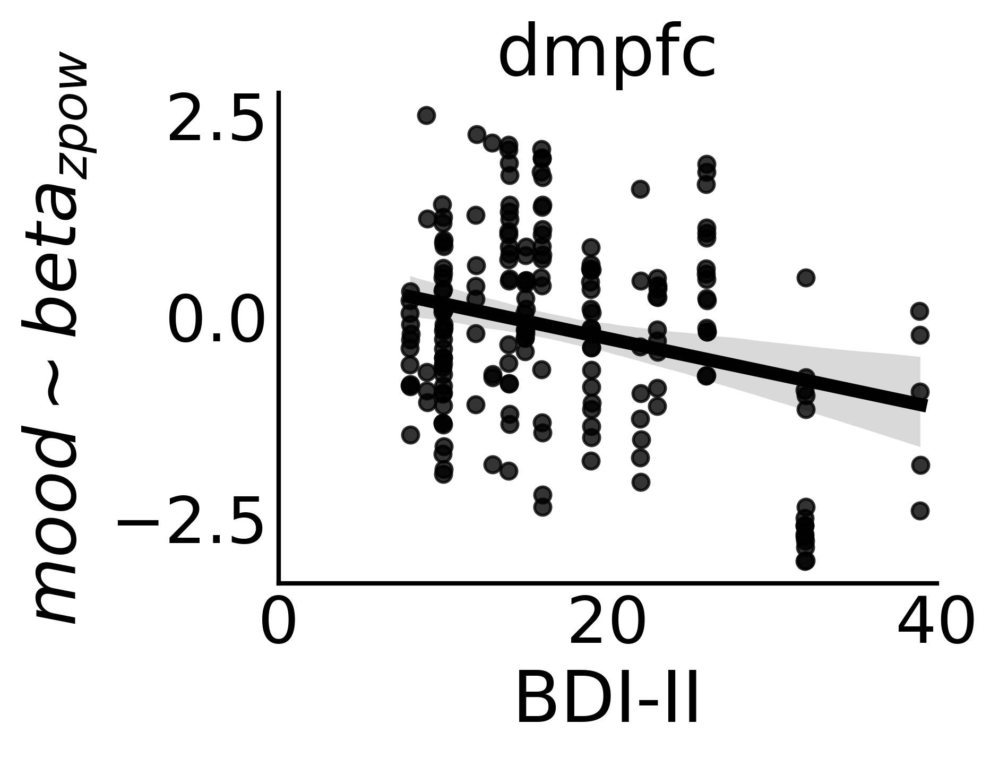

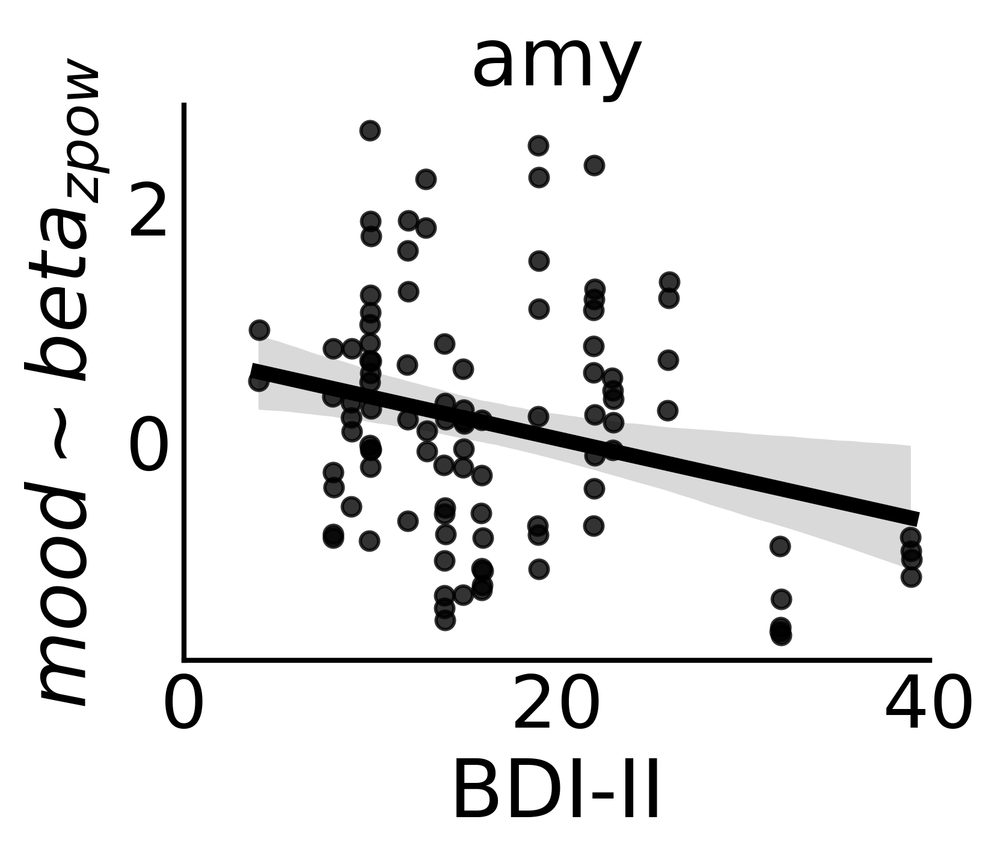

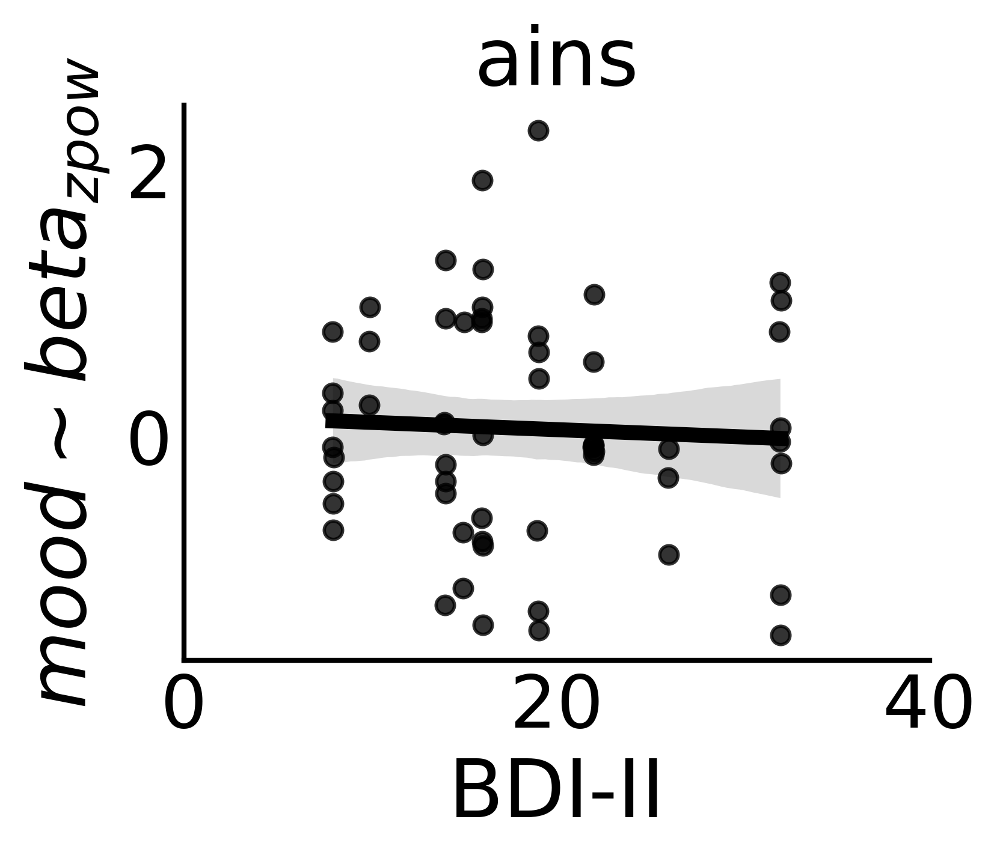

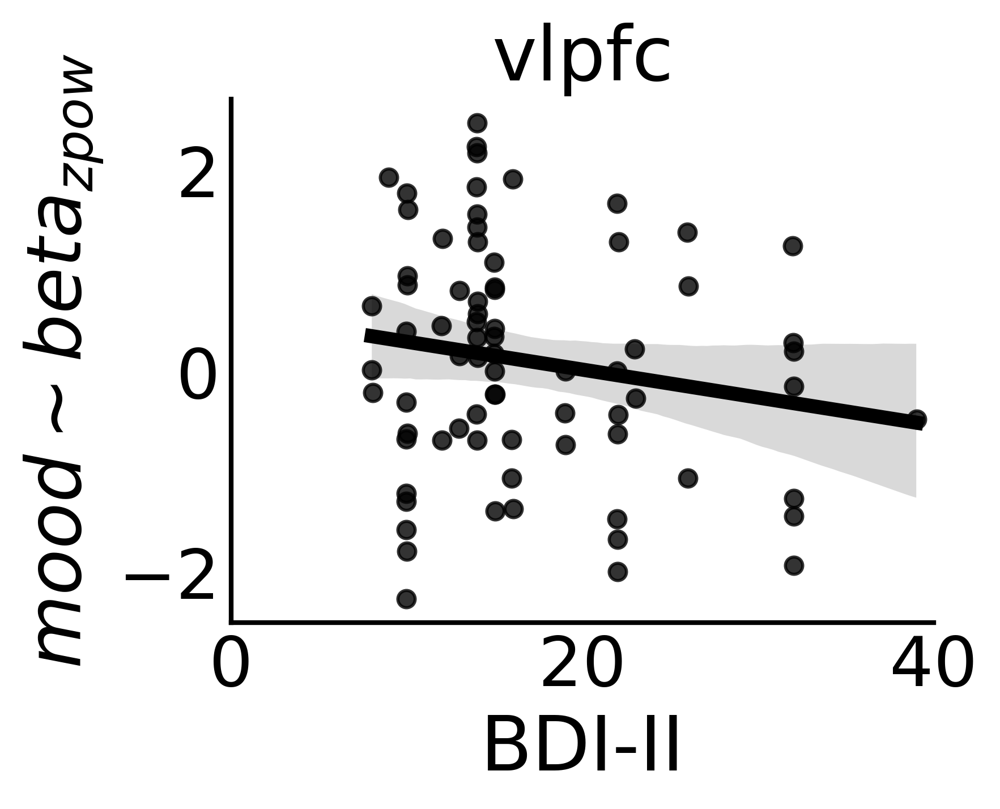

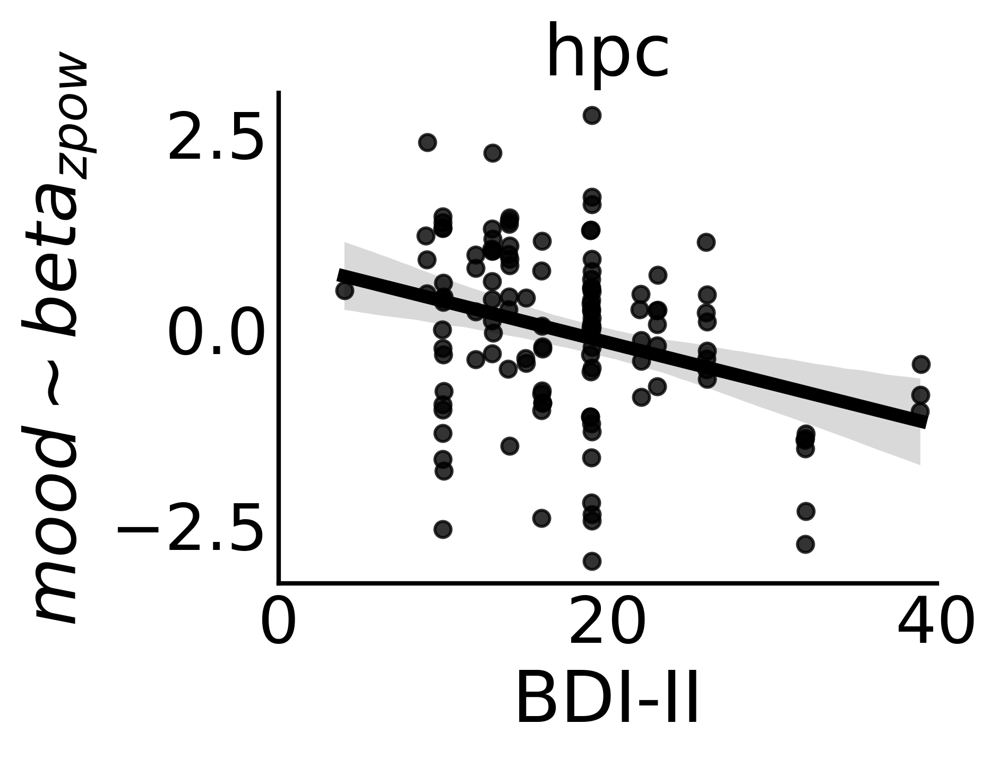

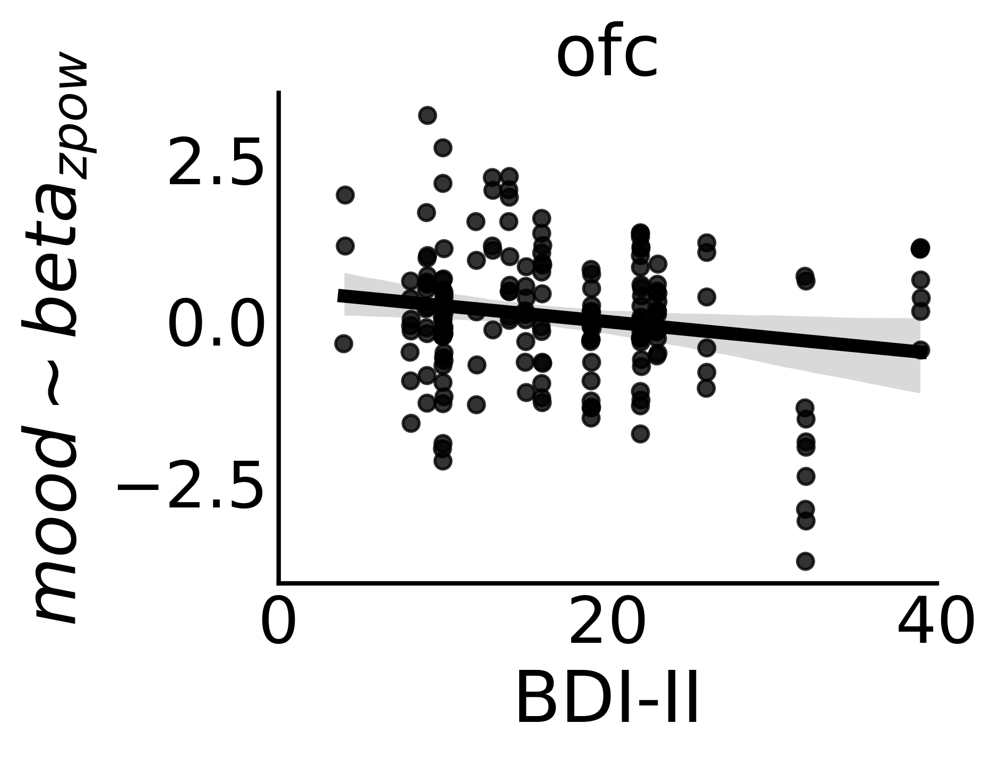

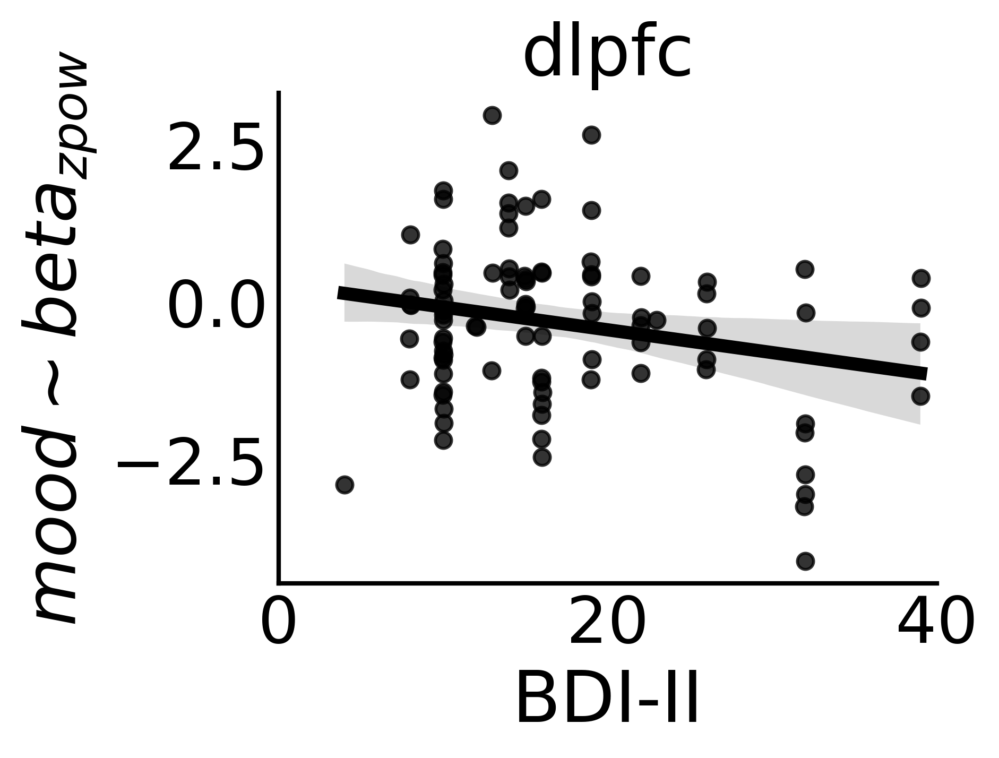

In [74]:

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_band_pow',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'$mood \sim {band}_{{zpow}}$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [75]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_band_pow.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:02:34                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5476      0.501     33.006     

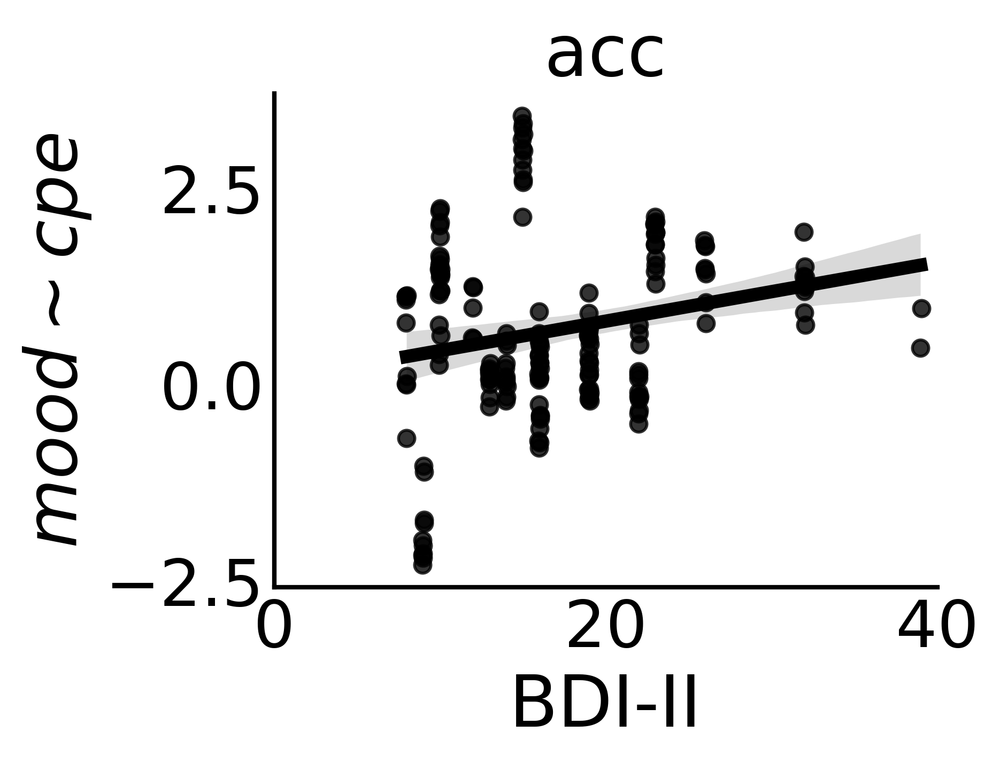

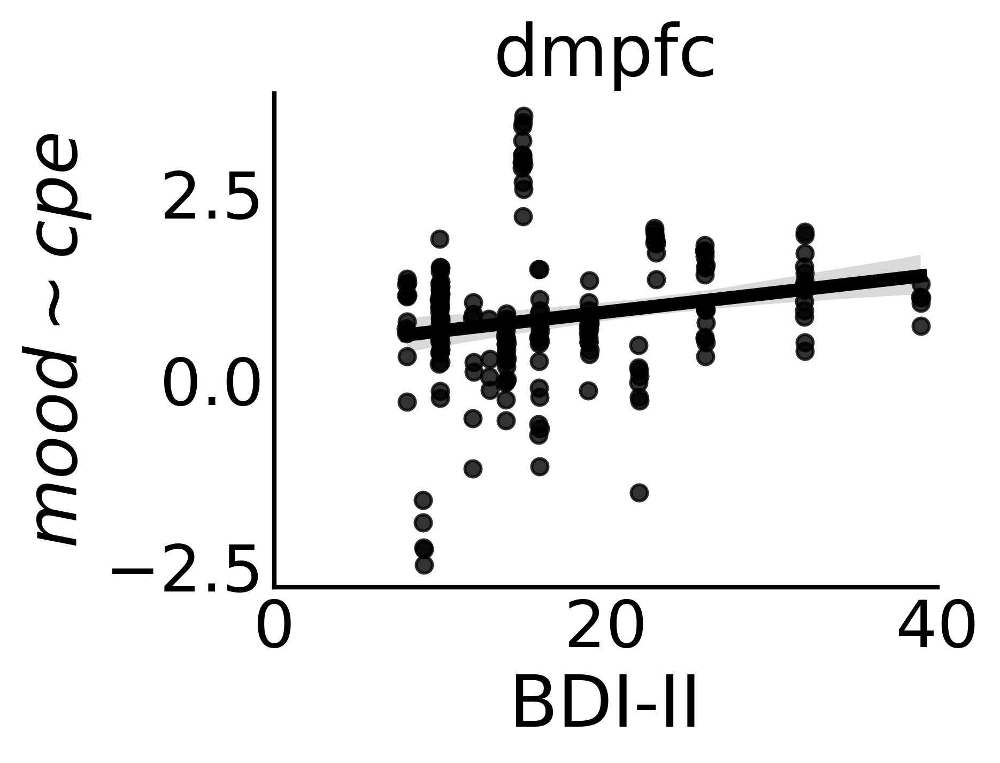

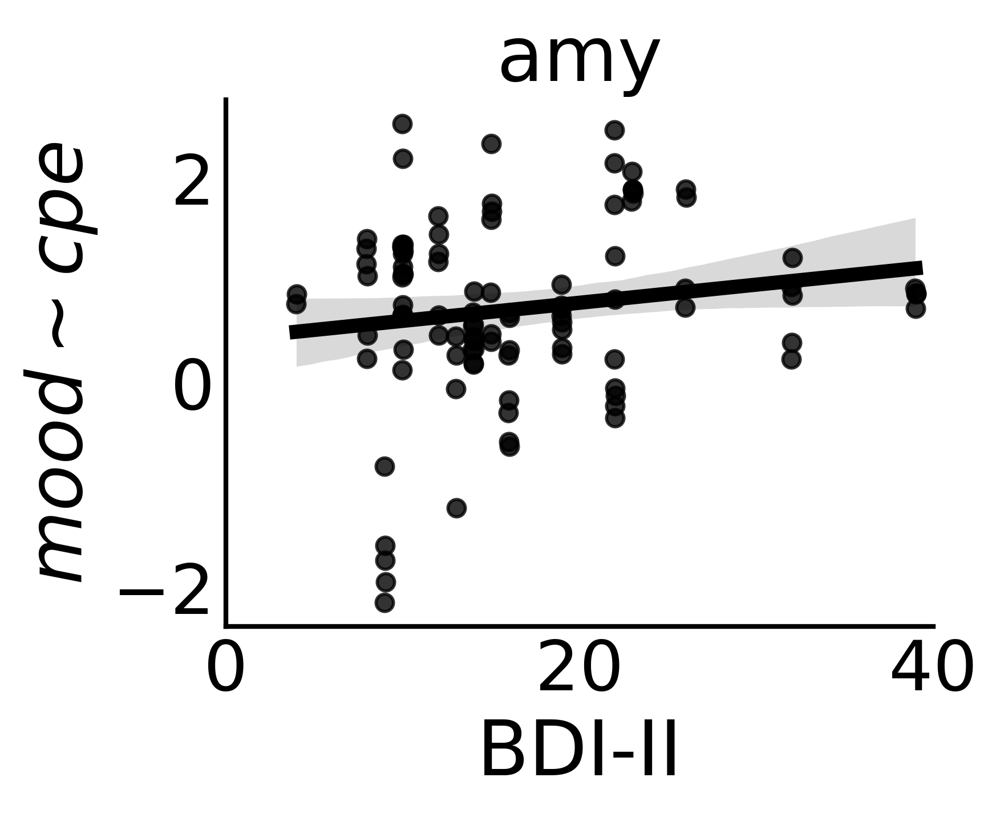

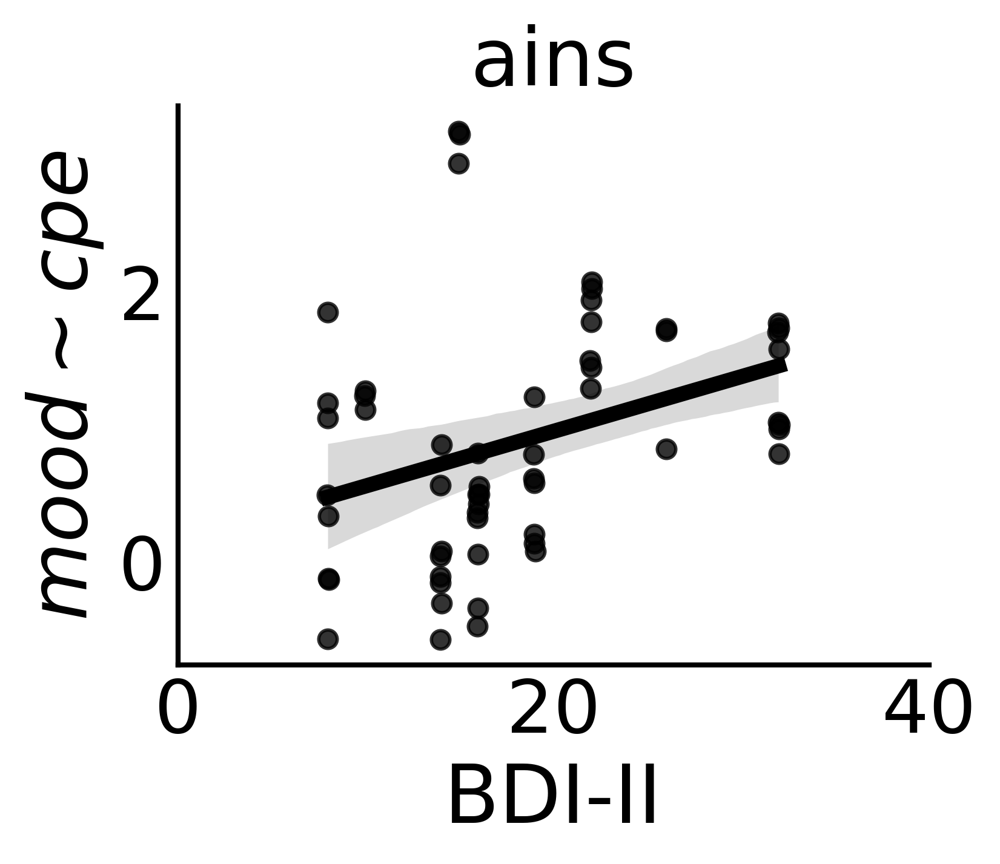

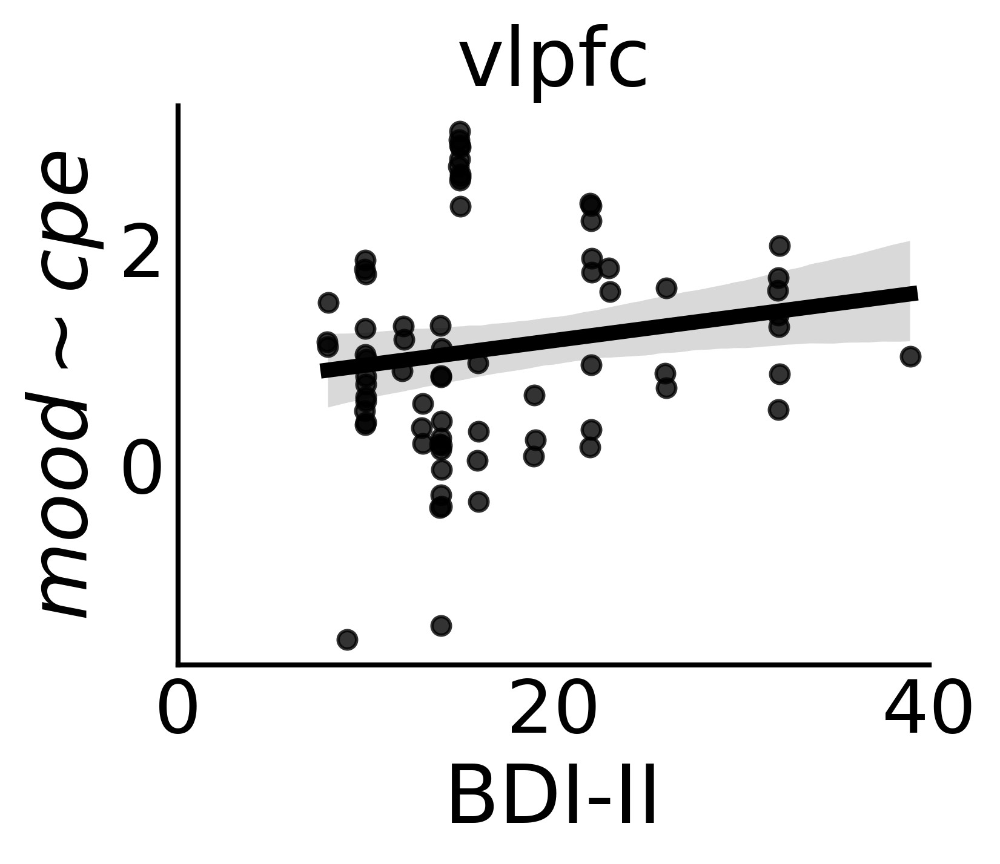

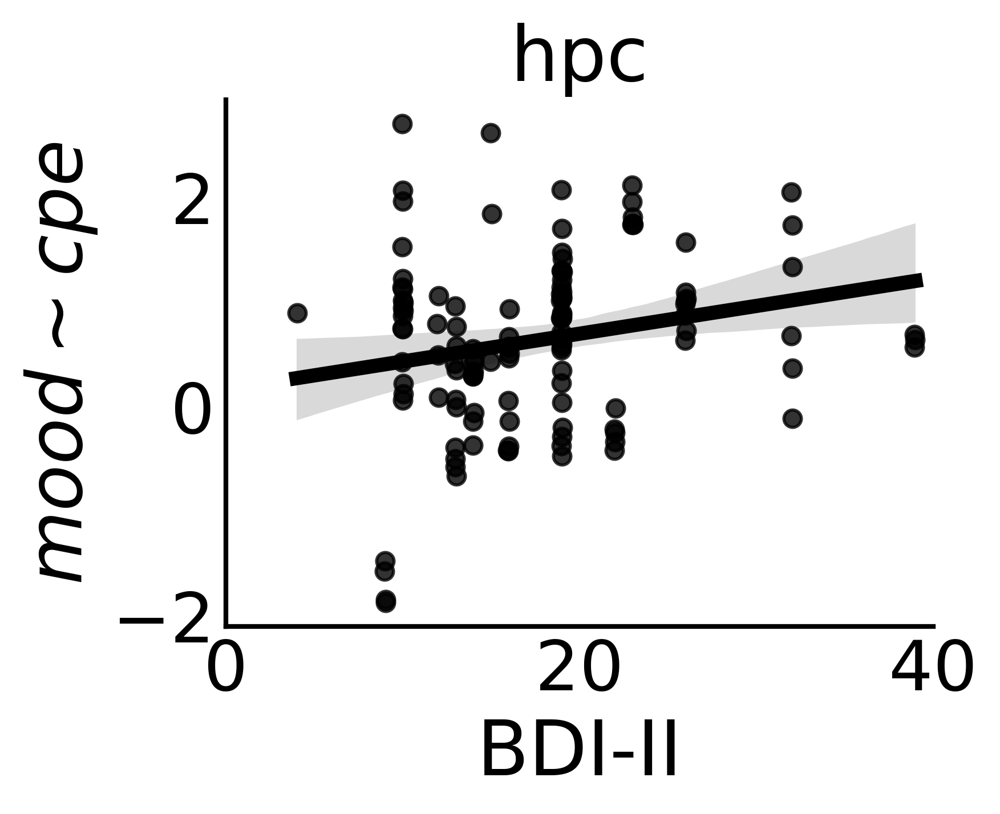

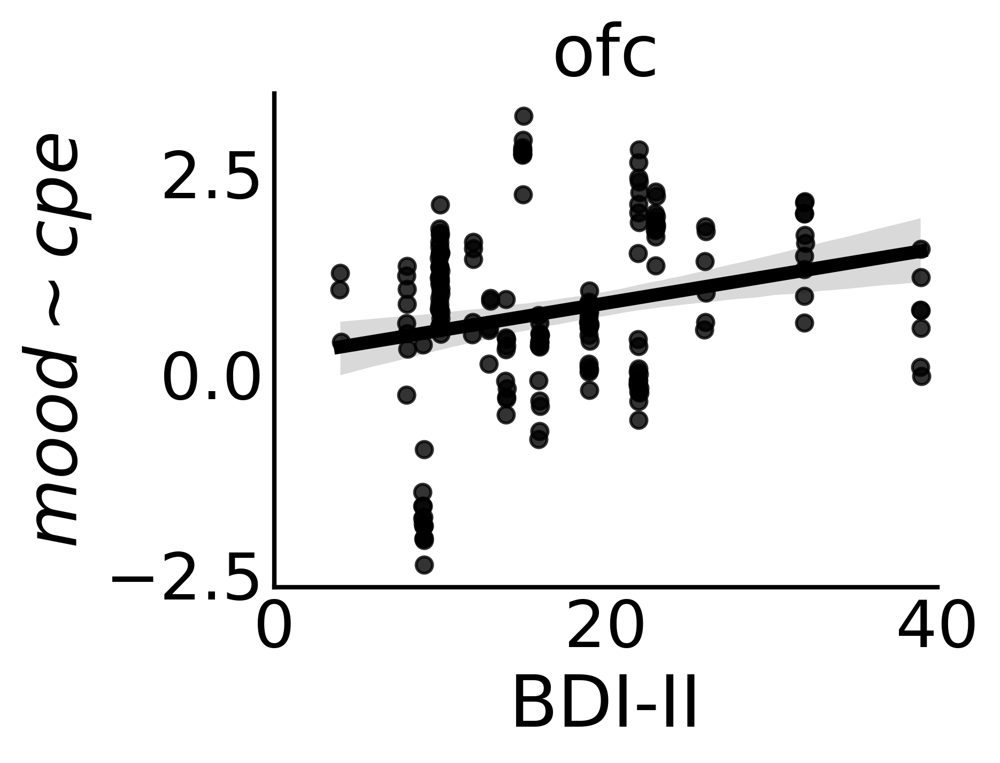

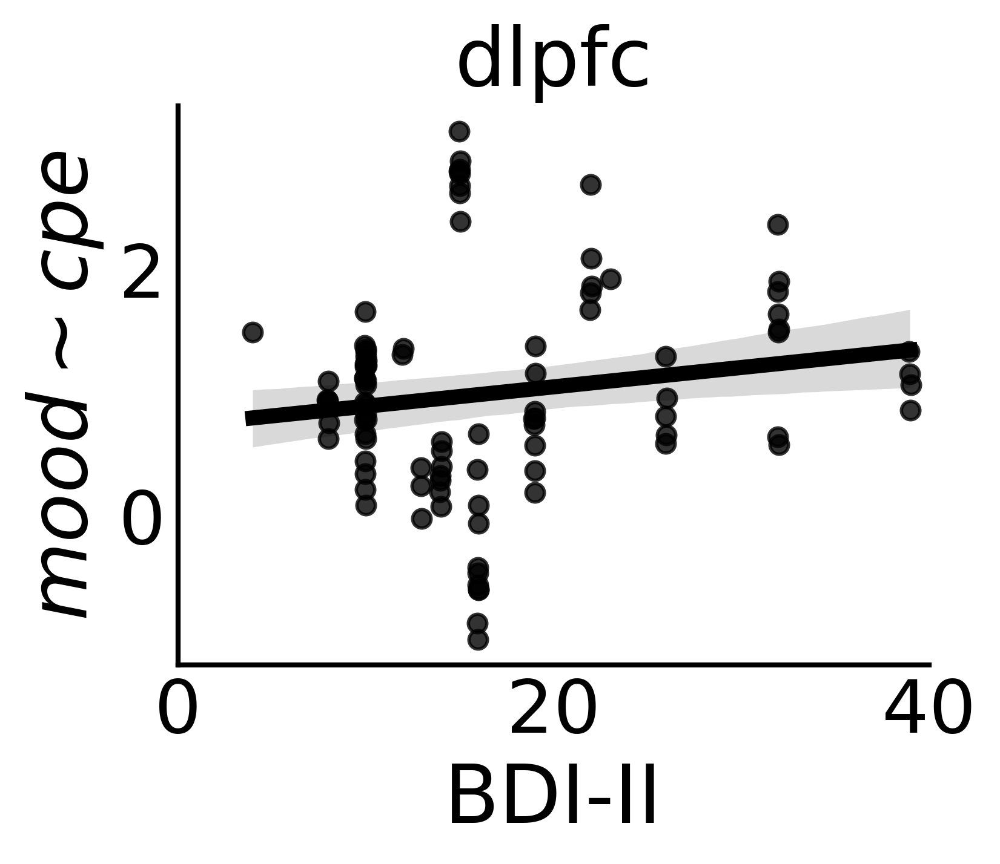

In [76]:
###### CPE CORR 

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'$mood \sim cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [77]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:02:37                                         
No. Iterations:                    18                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.7068      0.556     28.248     

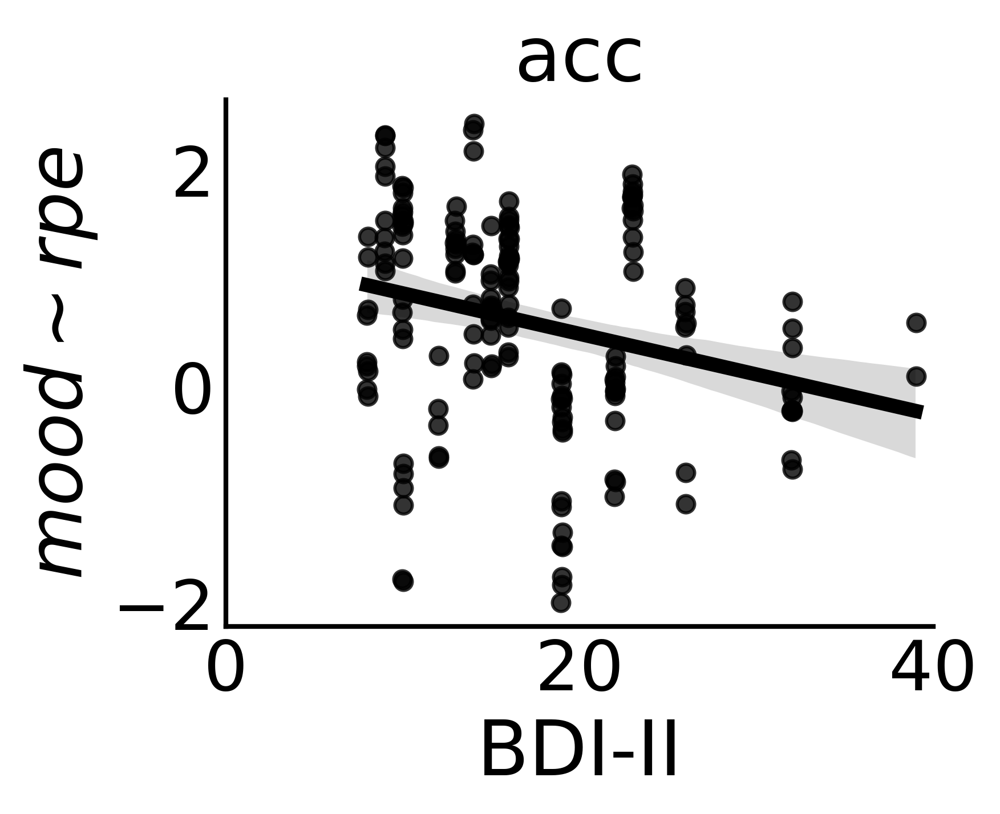

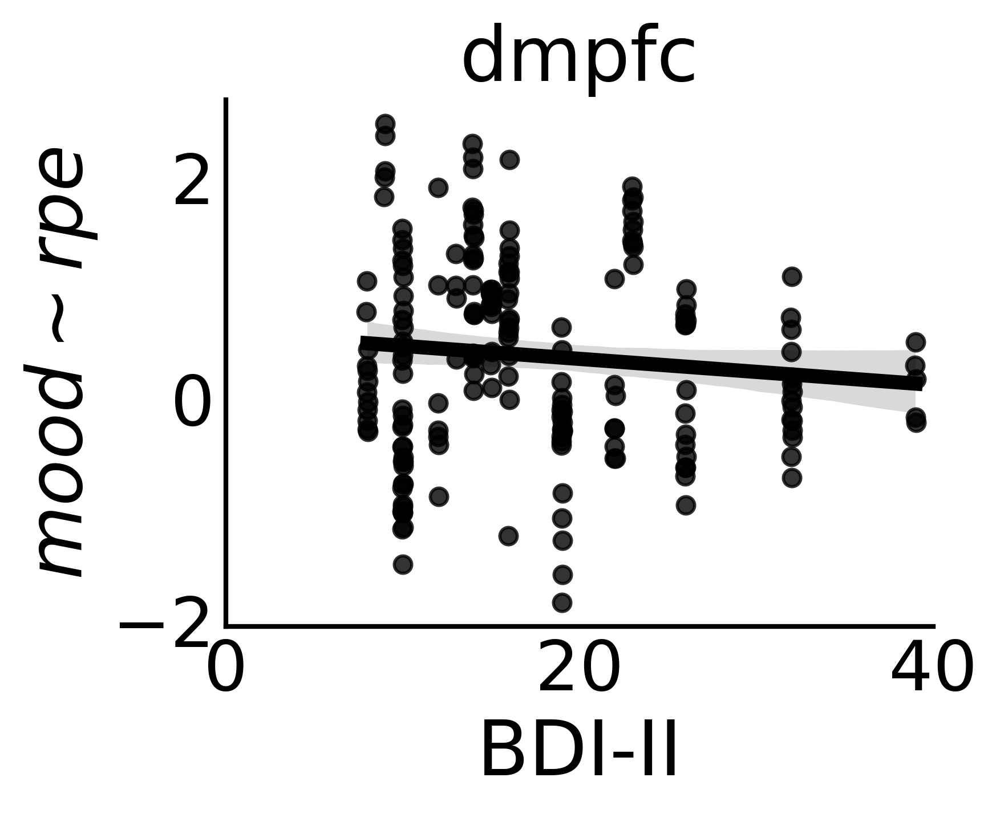

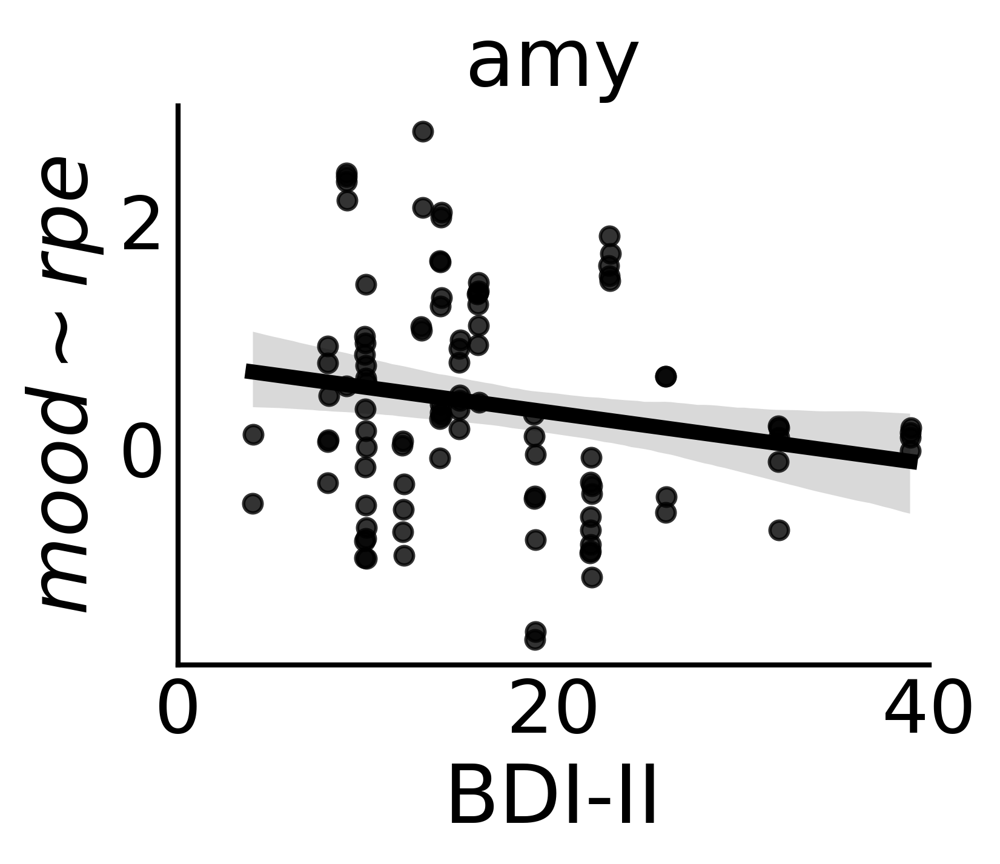

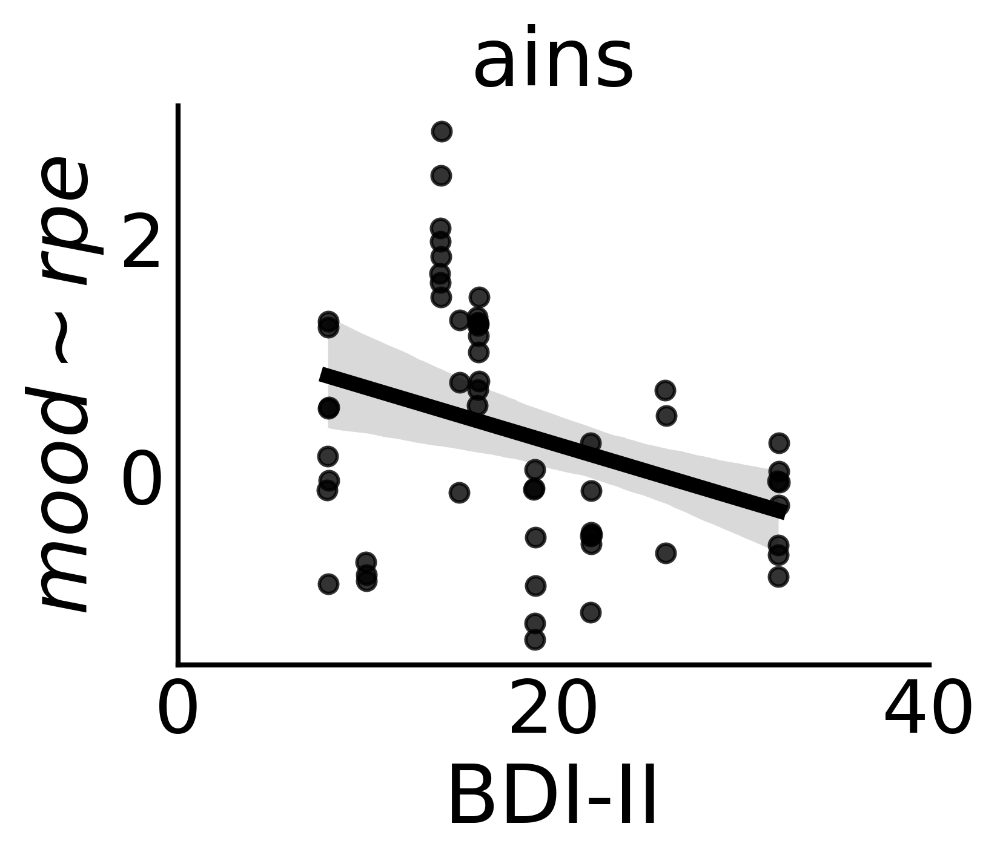

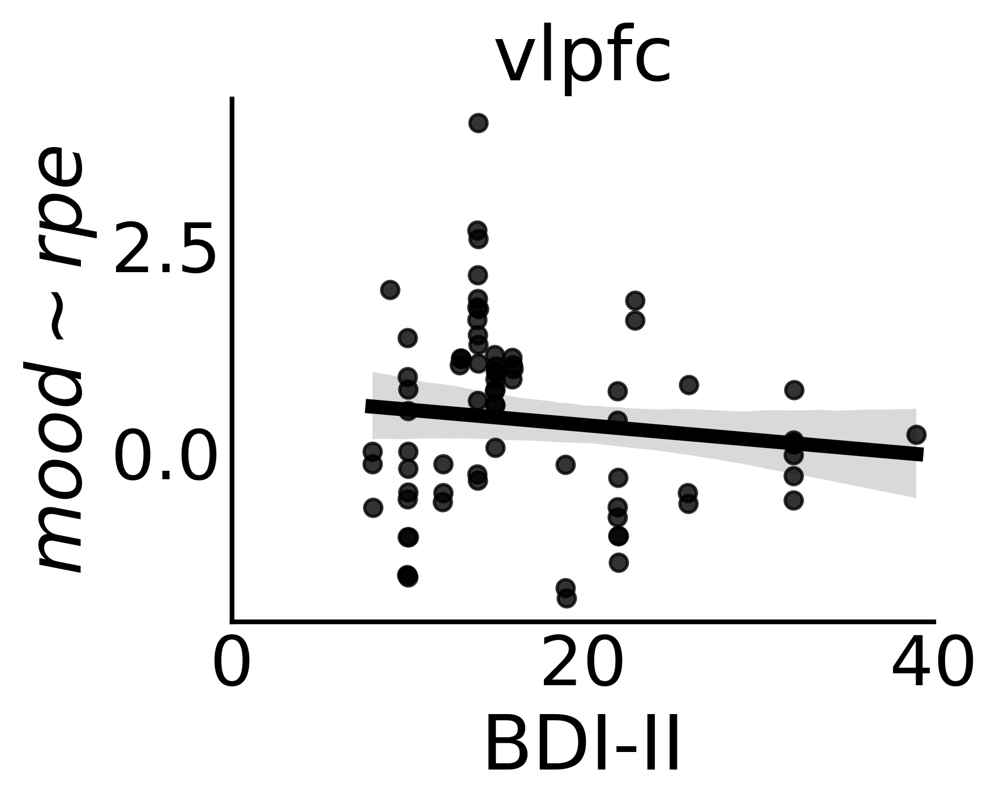

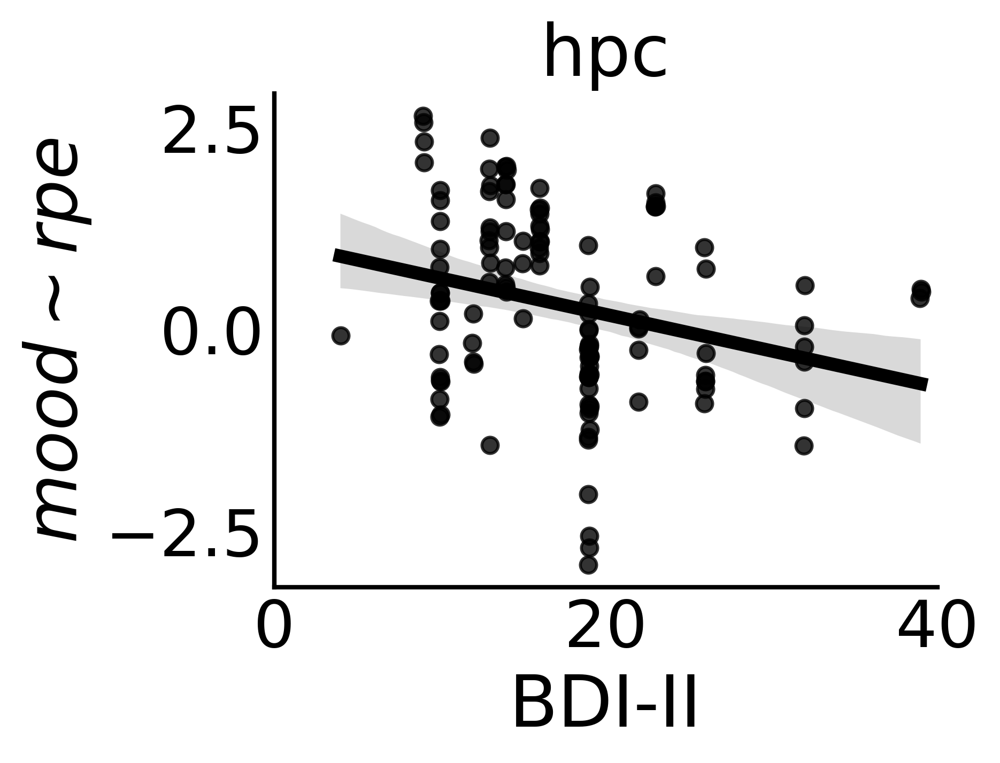

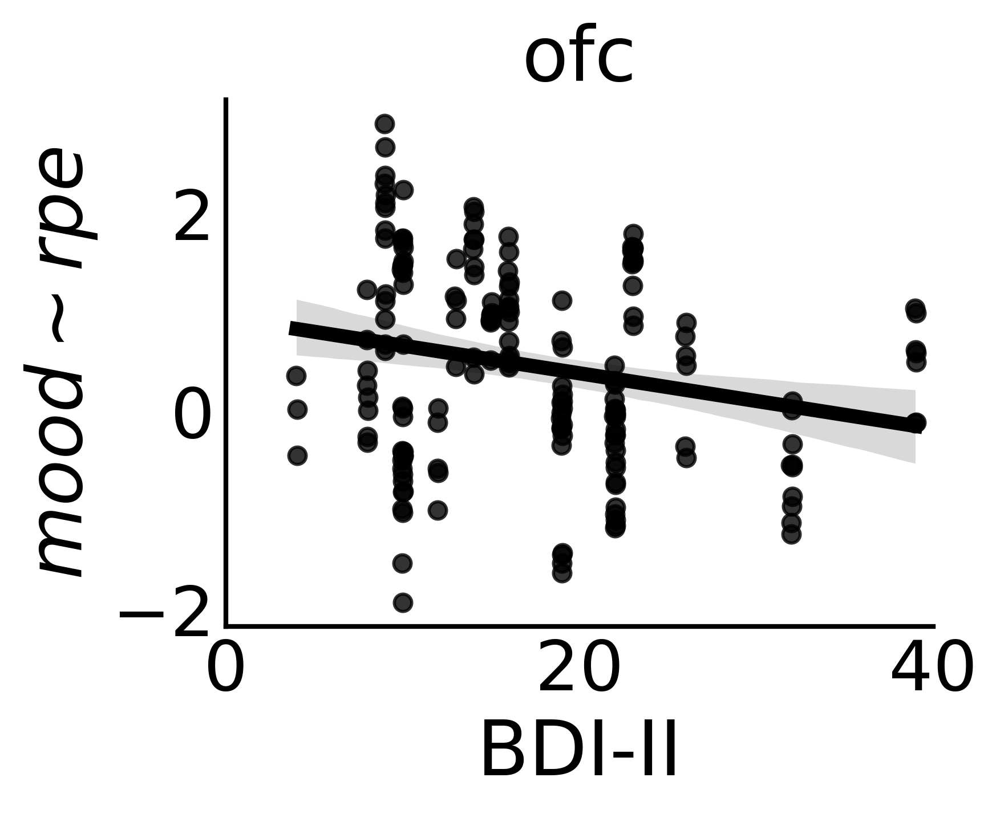

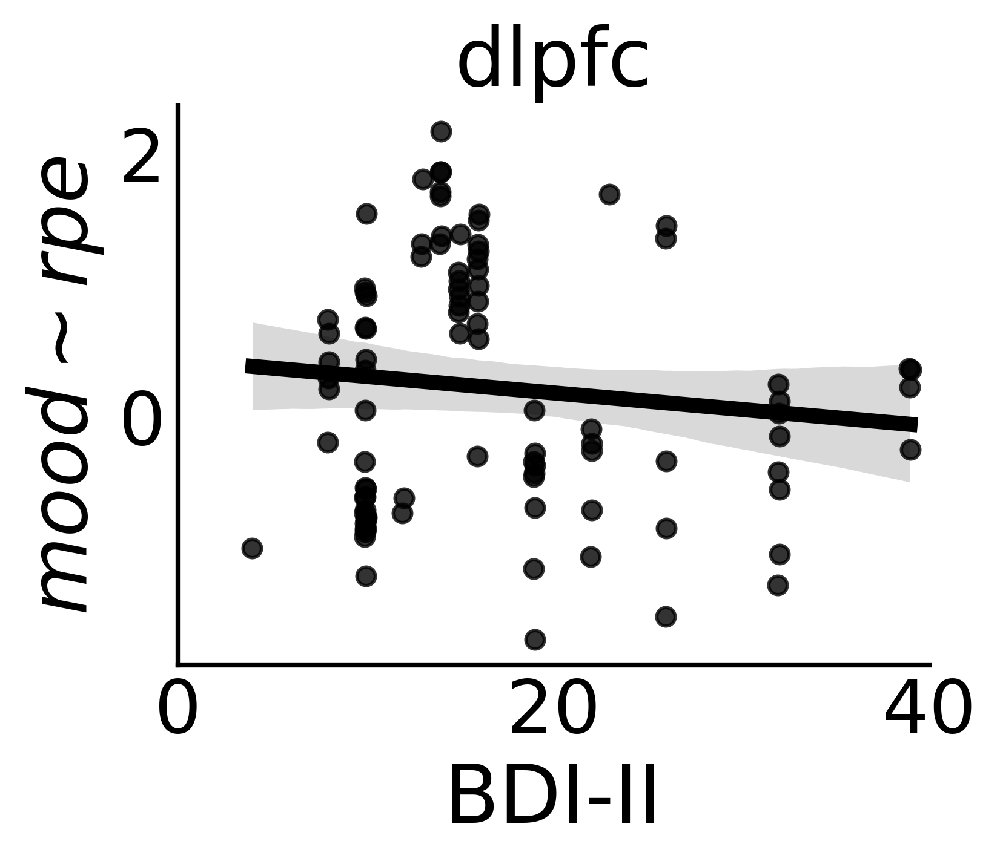

In [78]:
###### CPE CORR 

# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_rpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'$mood \sim rpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [79]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_rpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:02:40                                         
No. Iterations:                    14                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.5459      0.596     29.421     

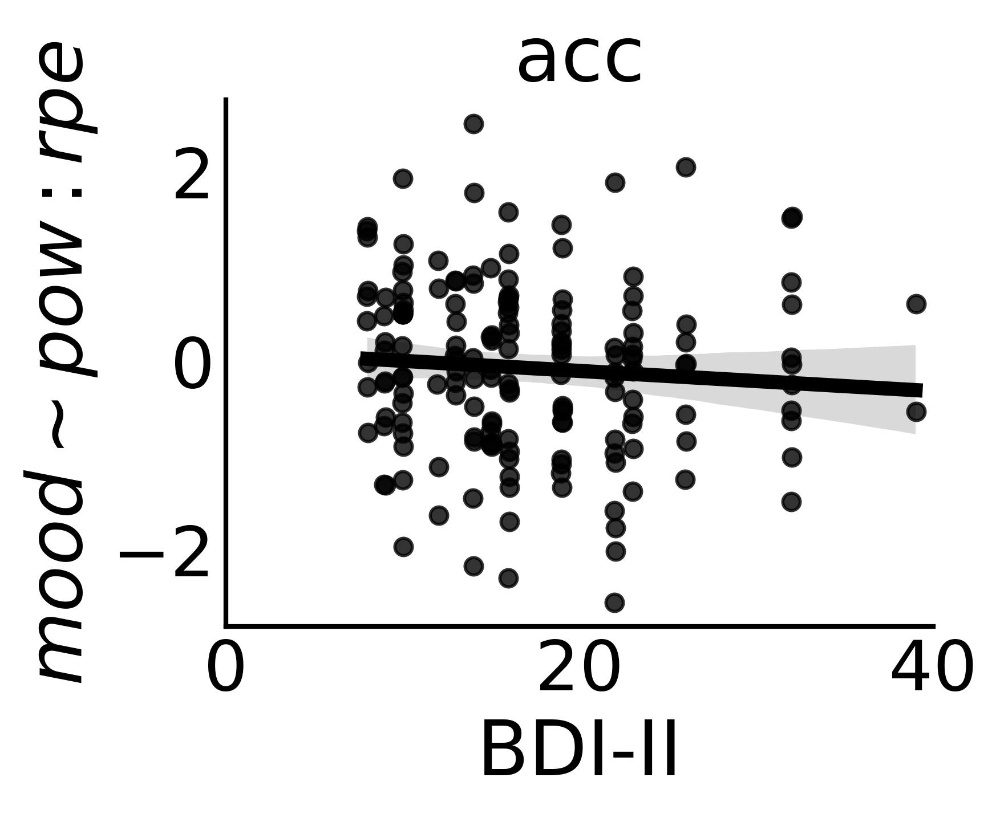

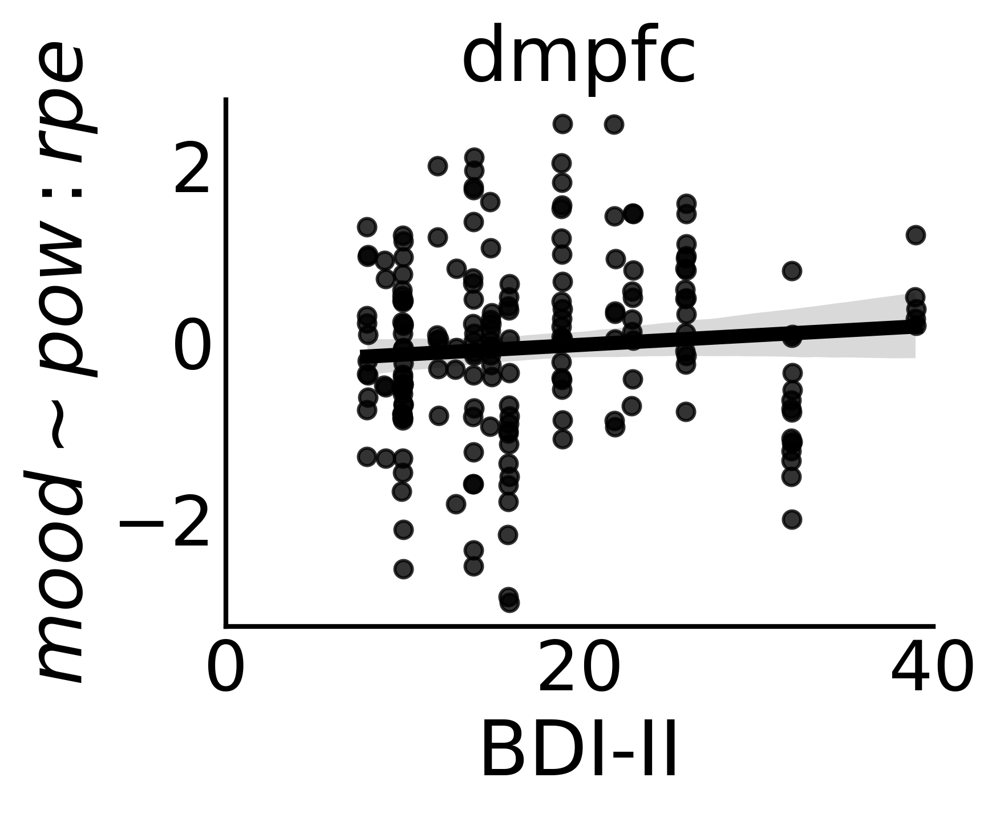

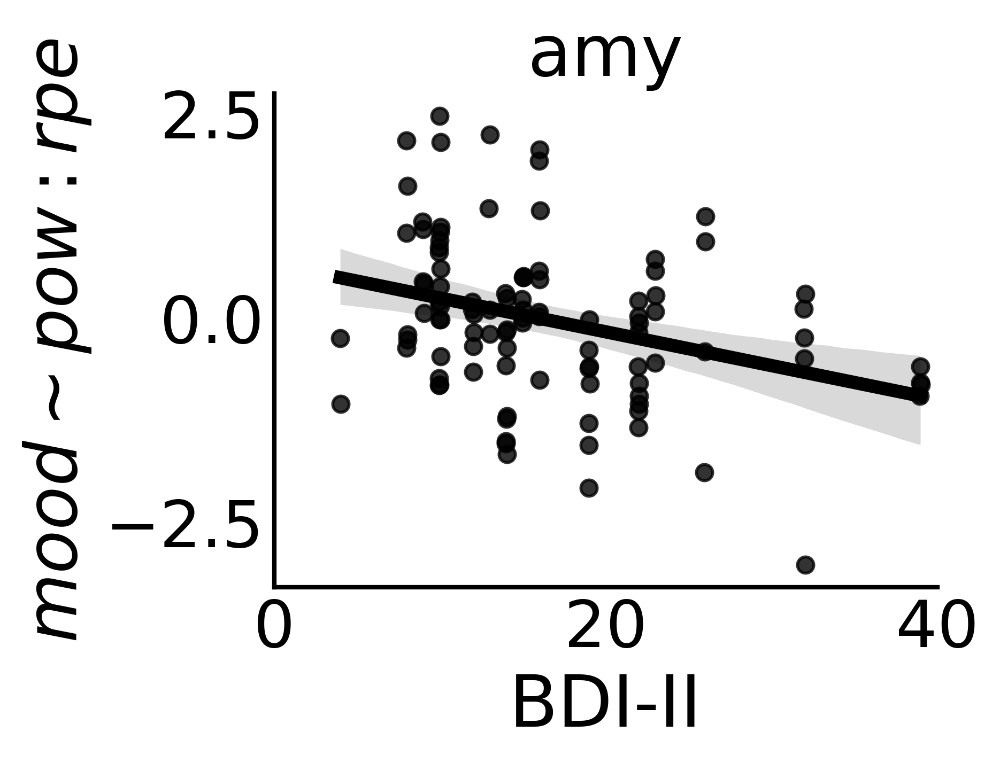

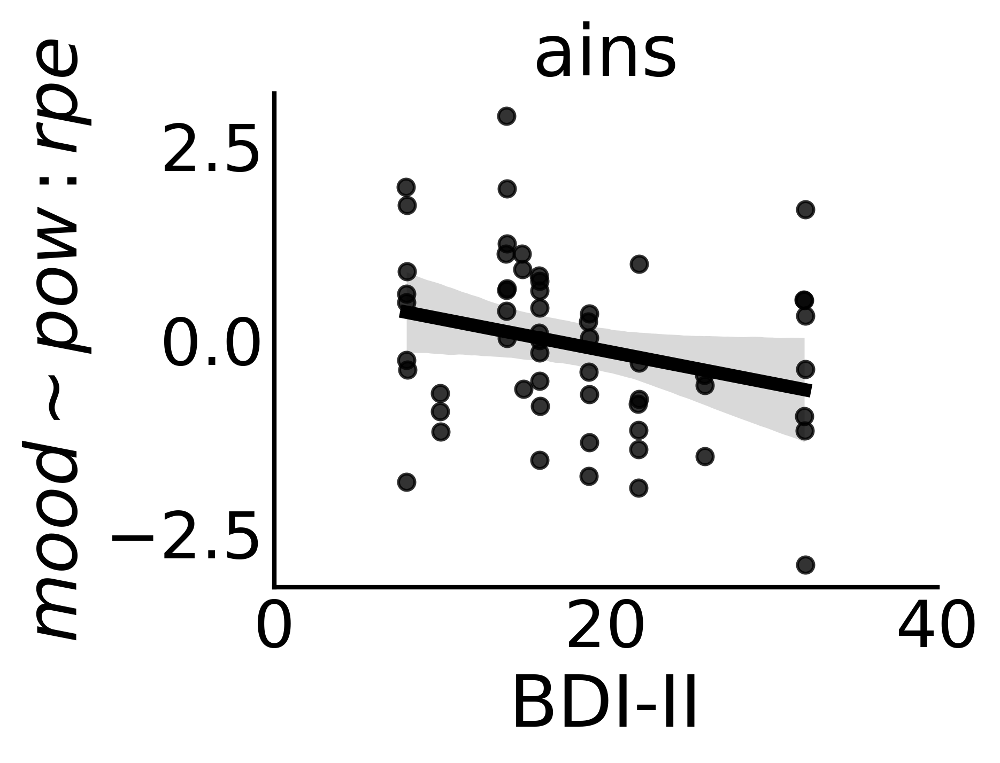

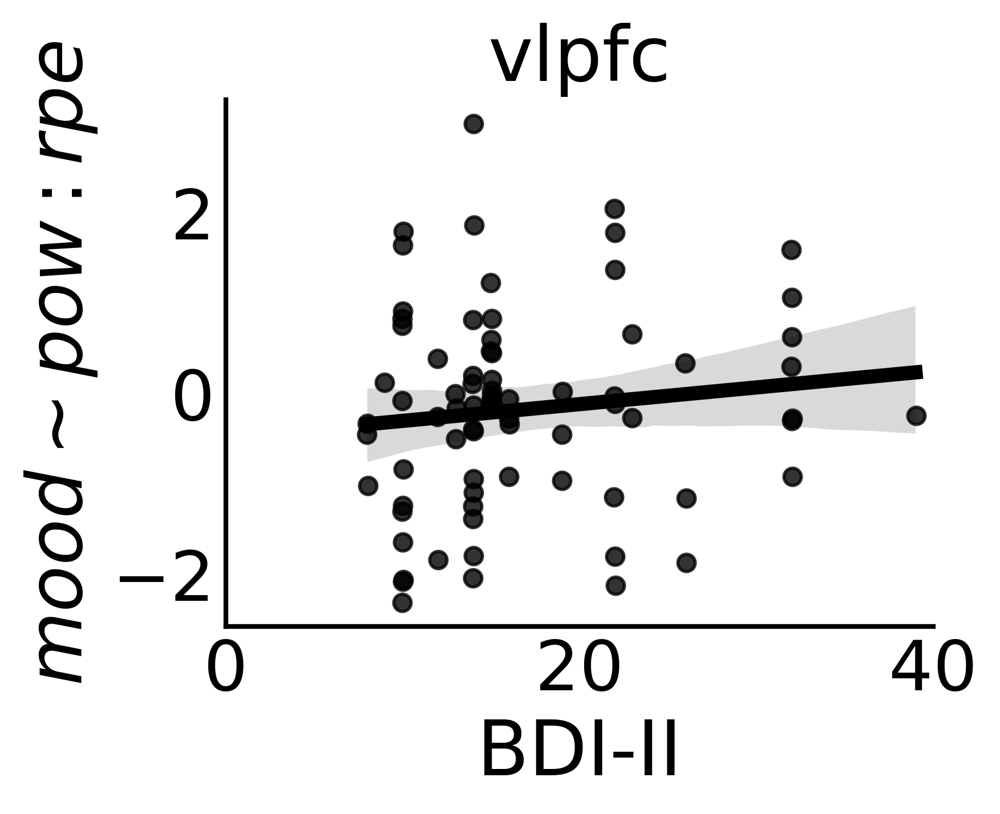

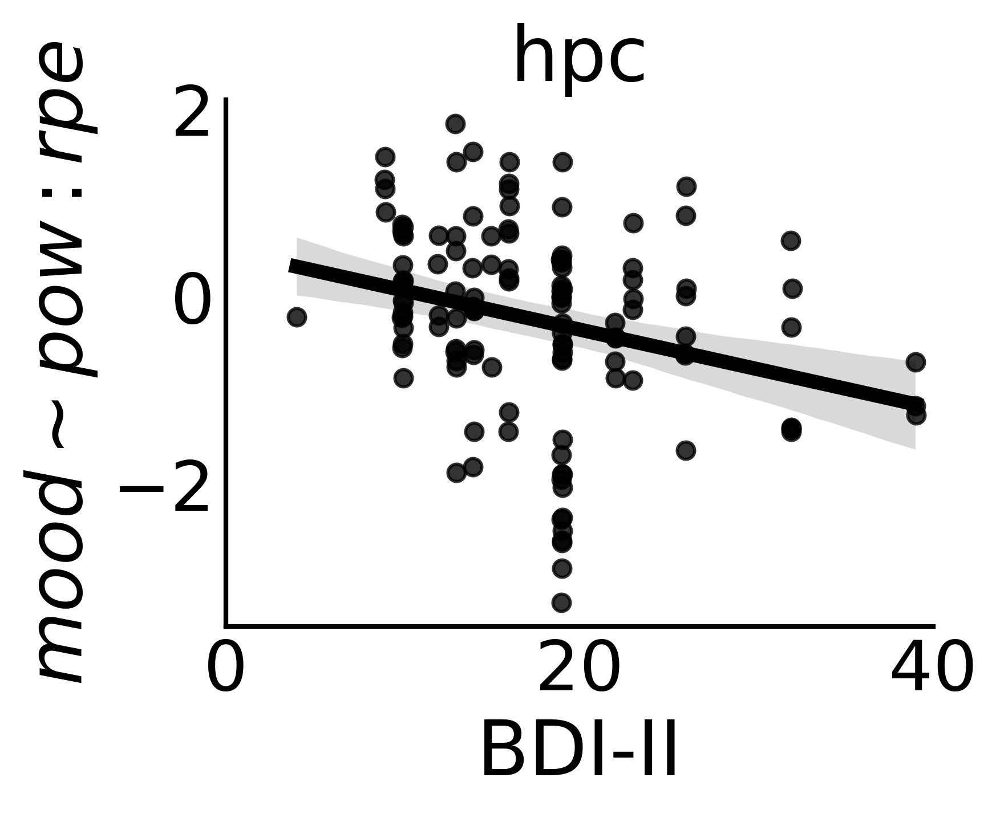

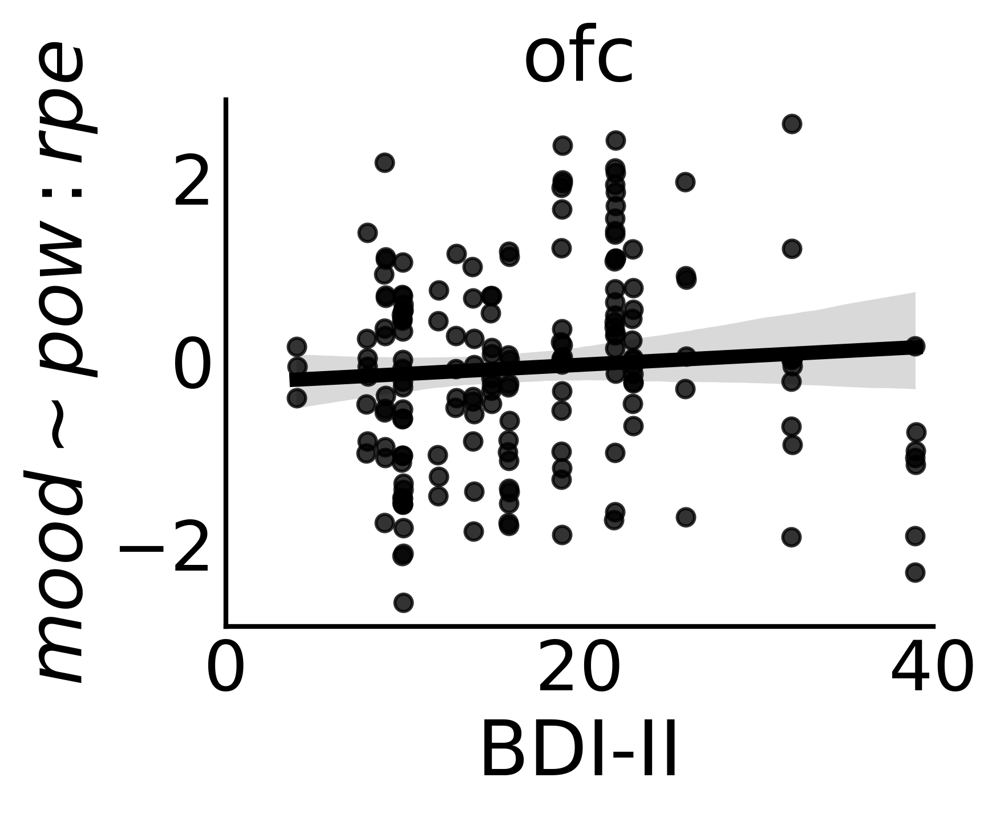

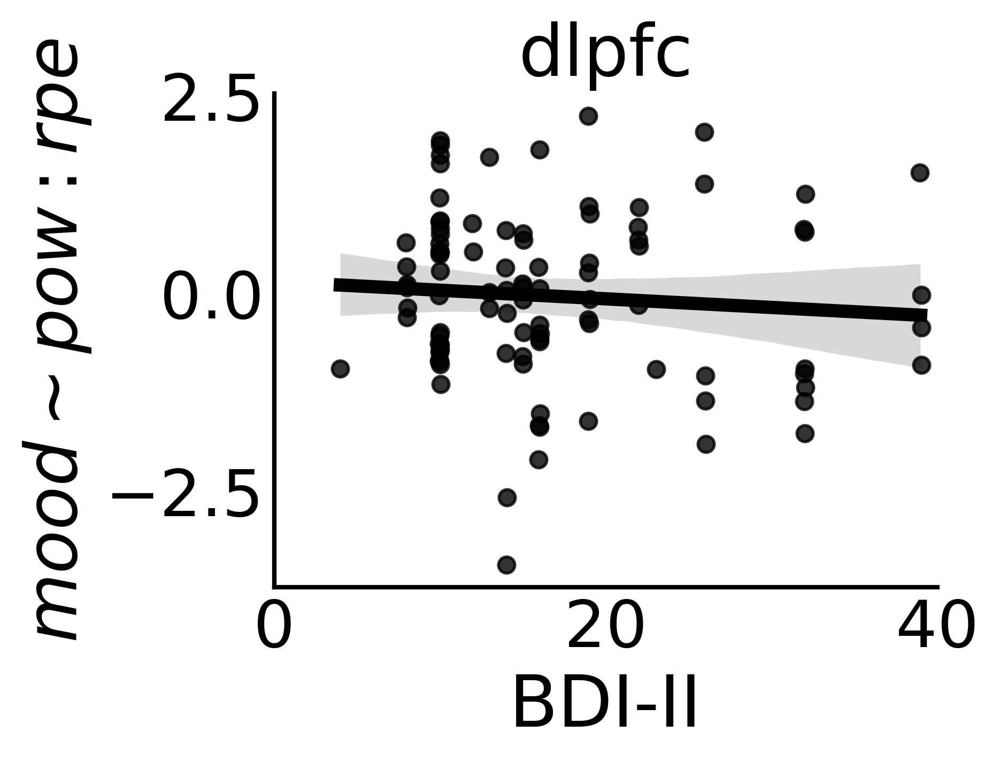

In [80]:
#### INTERACTION CORRS 
# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_pow_rpe_int',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'$mood \sim pow:rpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [81]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_pow_rpe_int.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())
    
    

acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:02:42                                         
No. Iterations:                     9                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.4561      0.486     33.849     

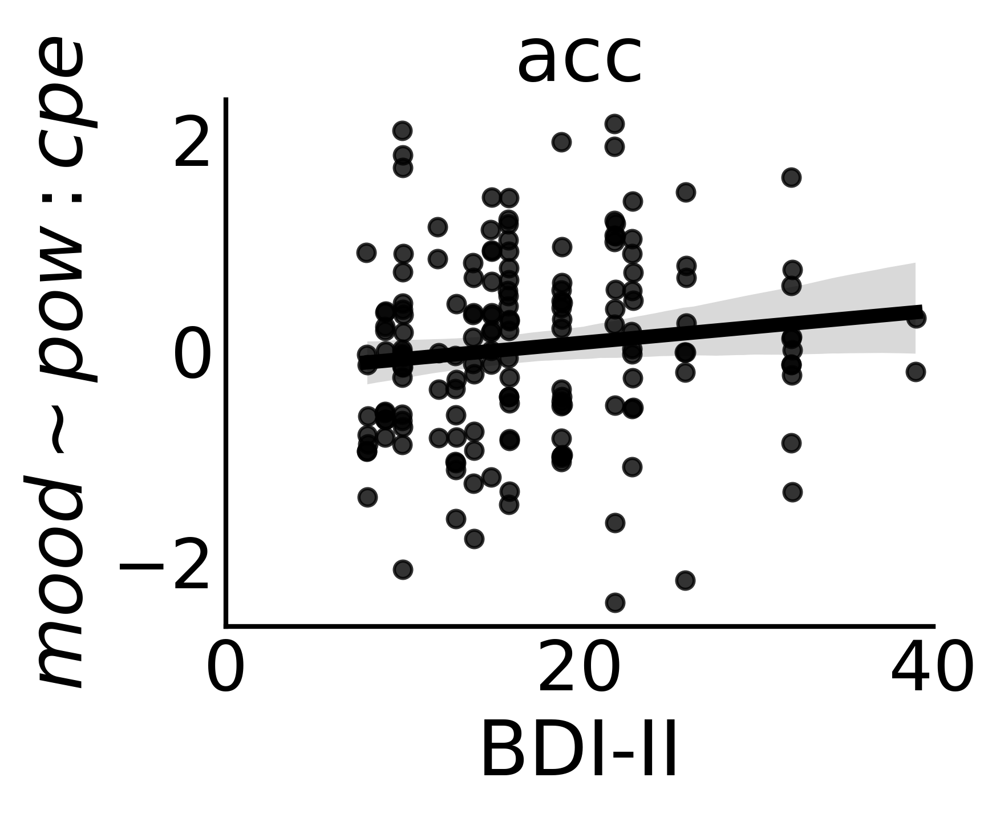

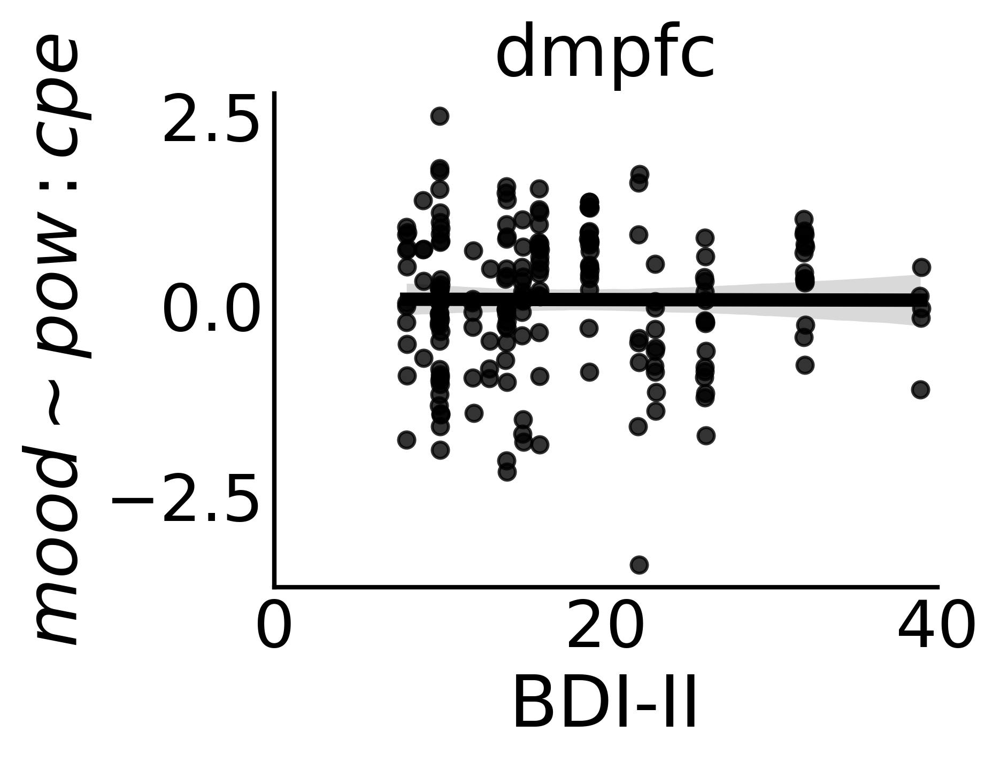

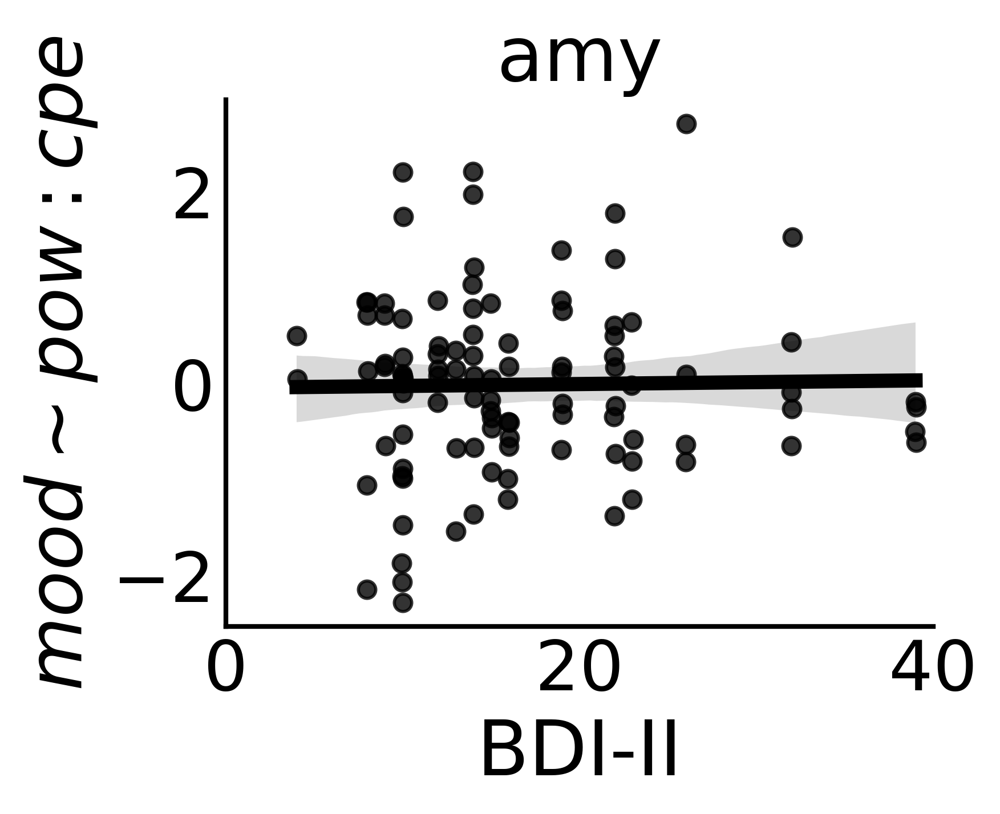

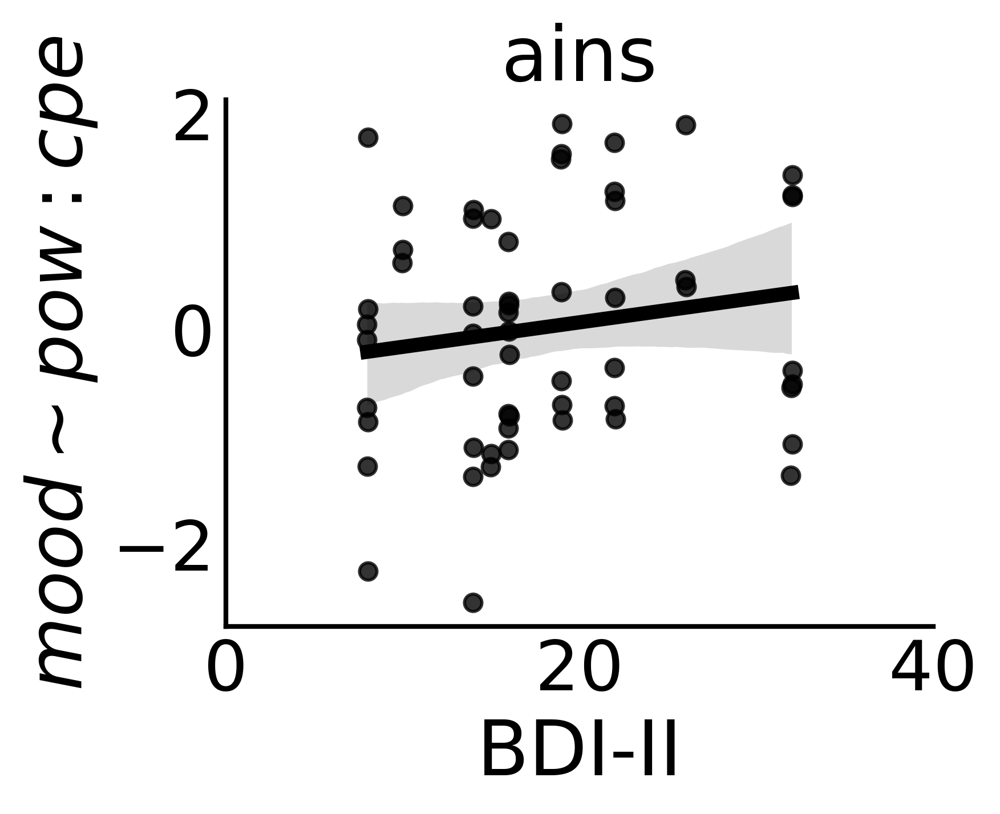

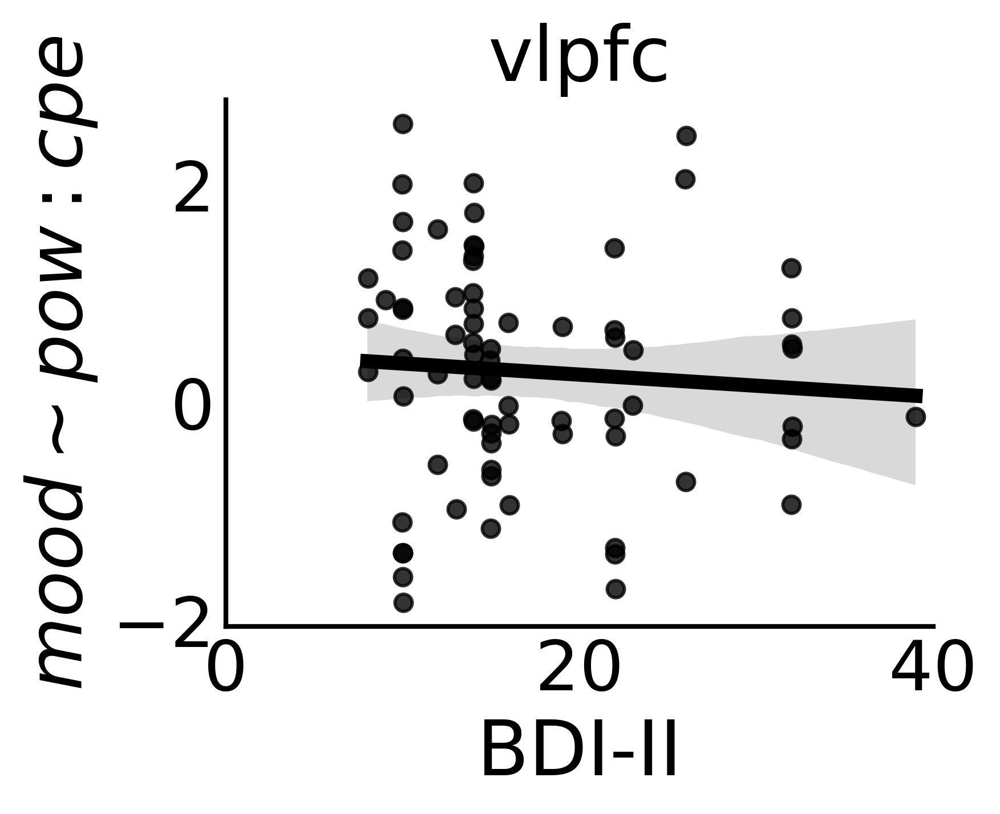

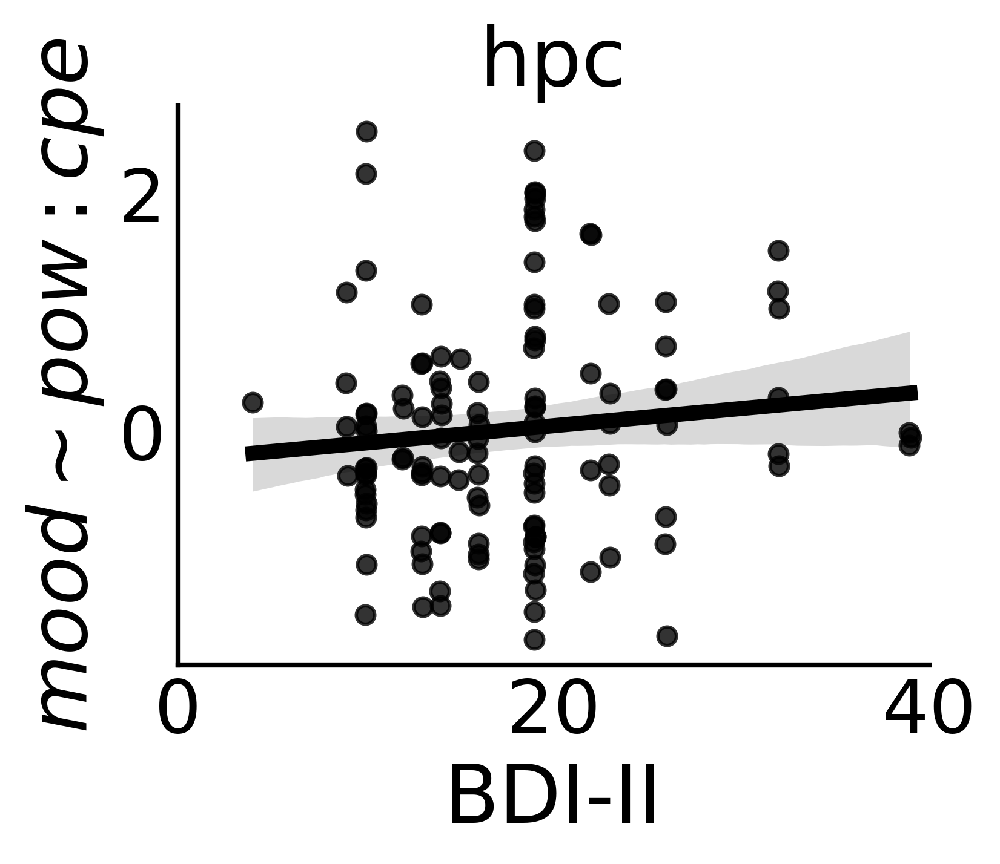

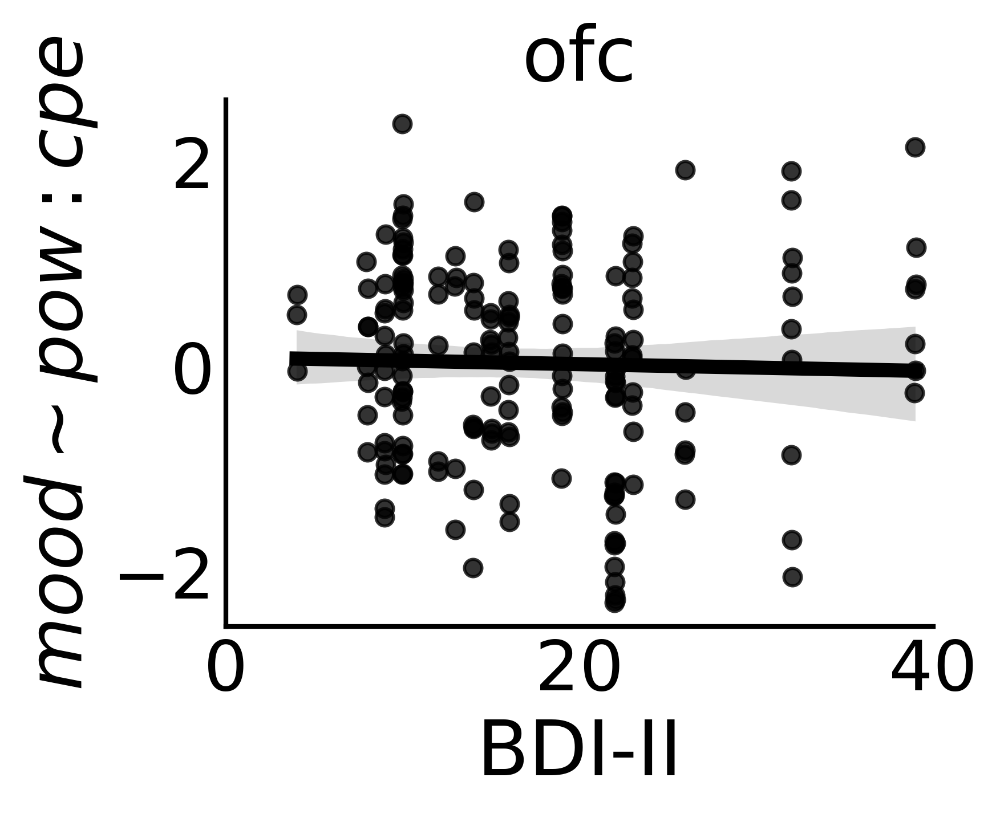

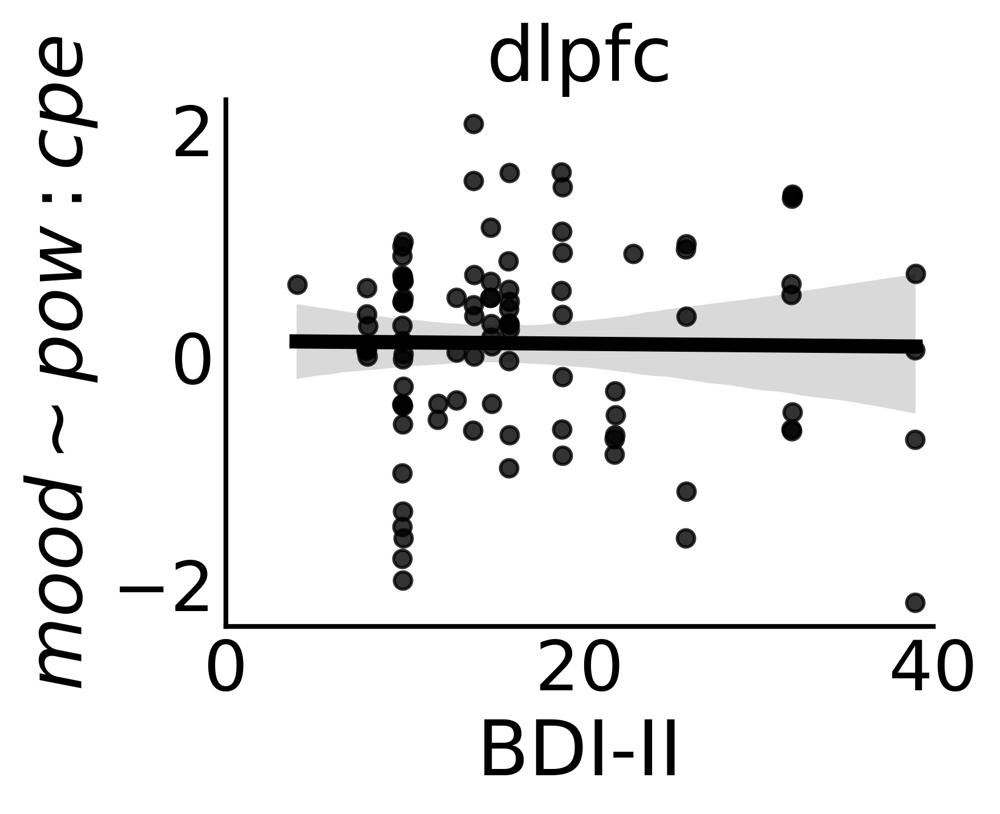

In [82]:
#### INTERACTION CORRS 
# sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in results.roi.unique().tolist():
    
#     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
    roi_temp_data = results[results.roi==roi]
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

    sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_pow_cpe_int',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
    plt.xlabel('BDI-II')
    plt.xlim([0,40])
    
    plt.tick_params(length=0) 
    plt.ylabel(fr'$mood \sim pow:cpe$')


    plt.title(f'{roi}')
    sns.despine()

#     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=400,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    


In [83]:
### robust regression bdi ~ cpe coefficients
roi_rlm_dict = {}

for roi in results.roi.unique().tolist():
    roi_df = results[results.roi == roi]
    rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_pow_cpe_int.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    roi_rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())
    
    

acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 20 Nov 2024                                         
Time:                        04:02:45                                         
No. Iterations:                    10                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.4087      0.482     34.037     

In [296]:
# ###### CPE CORR 

# # sns.set_context("talk",rc={'axes.linewidth': 1.5})

# for roi in results.roi.unique().tolist():
    
# #     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
#     roi_temp_data = results[results.roi==roi]
        
#     fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

#     sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_TrialEV_t1',scatter=True,ci=95,
#                 fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
#     plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
#     plt.tick_params(length=0) 
#     plt.ylabel(fr'$mood \sim cpe$')


#     plt.title(f'{roi}')
#     sns.despine()

# #     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
# #         bbox_inches='tight', pad_inches=0.1,dpi=400,
# #         facecolor='auto', edgecolor='auto',
# #         backend=None)
    


In [297]:
# ### robust regression bdi ~ cpe coefficients
# roi_rlm_dict = {}

# for roi in results.roi.unique().tolist():
#     roi_df = results[results.roi == roi]
#     rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_TrialEV_t1.values), M=sm.robust.norms.HuberT())
#     rlm_results = rlm.fit()
#     roi_rlm_dict[roi] = rlm_results
#     print(roi)
#     print(rlm_results.summary())


In [40]:
# ###### CPE CORR 

# # sns.set_context("talk",rc={'axes.linewidth': 1.5})

# for roi in results.roi.unique().tolist():
    
# #     corr_fig_id = f'{band}_{roi}_bdi_cpe_coeff_corr_{epoch_len}.pdf'
    
#     roi_temp_data = results[results.roi==roi]
        
#     fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=400)

#     sns.regplot(data=roi_temp_data,x='bdi',y='Z_Score_Profit_t1',scatter=True,ci=95,
#                 fit_reg=True,color = 'k',x_jitter = 0.05,scatter_kws={'s':30}) #034975
    
#     plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
#     plt.tick_params(length=0) 
#     plt.ylabel(fr'$mood \sim cpe$')


#     plt.title(f'{roi}')
#     sns.despine()

# #     plt.savefig(f'{fig_save_path}{corr_fig_id}', format=corr_fig_id.split('.')[-1], metadata=None,
# #         bbox_inches='tight', pad_inches=0.1,dpi=400,
# #         facecolor='auto', edgecolor='auto',
# #         backend=None)
    


In [41]:
# ### robust regression bdi ~ cpe coefficients
# roi_rlm_dict = {}

# for roi in results.roi.unique().tolist():
#     roi_df = results[results.roi == roi]
#     rlm = sm.RLM(roi_df.bdi.values, sm.add_constant(roi_df.Z_Score_Profit_t1.values), M=sm.robust.norms.HuberT())
#     rlm_results = rlm.fit()
#     roi_rlm_dict[roi] = rlm_results
#     print(roi)
#     print(rlm_results.summary())


# Run ROI MLMs 

In [9]:
mood_pow_df.columns

Index(['Unnamed: 0', 'epoch', 'time', 'freq', 'reref_ch_names', 'band_pow',
       'band', 'subj_id', 'bdi', 'bdi_thresh', 'Round', 'Rating',
       'RatingOnset', 'RT', 'Round_t1_idx', 'Round_t2_idx', 'Round_t3_idx',
       'epoch_t1_idx', 'epoch_t2_idx', 'epoch_t3_idx', 'norm_mood',
       'MoodChoiceOnset', 'SafeBet_t1', 'SafeBet_t2', 'SafeBet_t3',
       'LowBet_t1', 'LowBet_t2', 'LowBet_t3', 'HighBet_t1', 'HighBet_t2',
       'HighBet_t3', 'Profit_t1', 'Profit_t2', 'Profit_t3', 'TotalProfit_t1',
       'TotalProfit_t2', 'TotalProfit_t3', 'GambleEV_t1', 'GambleEV_t2',
       'GambleEV_t3', 'TrialEV_t1', 'TrialEV_t2', 'TrialEV_t3', 'CR_t1',
       'CR_t2', 'CR_t3', 'choiceEV_t1', 'choiceEV_t2', 'choiceEV_t3', 'rpe_t1',
       'rpe_t2', 'rpe_t3', 'cf_t1', 'cf_t2', 'cf_t3', 'cpe_t1', 'cpe_t2',
       'cpe_t3', 'mood_epoch_len', 'next_round_start', 'roi', 'hemi',
       'unique_reref_ch'],
      dtype='object')

In [10]:
outcome_var  = 'band_pow'
rand_eff_var = 'unique_reref_ch'
# reg_vars     = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
# rand_vars    = ['norm_mood','rpe_t1','Profit_t1', 'cpe_t1']
reg_vars     = ['norm_mood','cpe_t1','norm_mood:cpe_t1']
rand_vars    = ['norm_mood','cpe_t1','norm_mood:cpe_t1']


In [11]:
fit_dict = {f'{roi}':fit_mixed_model(mood_pow_df[mood_pow_df.roi==roi],
                                        reg_vars,rand_vars,outcome_var,rand_eff_var) 
                for roi in mood_pow_df.roi.unique().tolist()}

In [12]:
fit_dict

{'acc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7d9fd76e0>,
 'dmpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7d9e02ed0>,
 'amy': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da4a8d70>,
 'ains': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da0e05f0>,
 'vlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da41fd40>,
 'hpc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da4b1e80>,
 'ofc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da41f200>,
 'pins': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da41f290>,
 'dlpfc': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x2ac7da4b2b40>}

In [13]:
fit_results = []

for roi in list(fit_dict.keys()):
    roi_fit = mixed_eff_results_df(fit_dict[roi],mood_pow_df[mood_pow_df.roi==roi],
                                    rand_eff_var=rand_eff_var,region_type='roi')
    fit_results.append(roi_fit)
    
fit_results = pd.concat(fit_results).reset_index(drop=True)
fit_results['band'] = 'beta'
# fit_results.to_csv(f'{save_dir}beta_coh_mlm_roi_fit_results_{date}.csv')

In [14]:
fit_results

,unique_reref_ch,subj_id,region_type,bdi,raw_Intercept,raw_norm_mood,raw_cpe_t1,raw_norm_mood:cpe_t1,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,band
0,DA023_lac1-lac2,DA023,acc,14,-0.021410,0.002241,-0.002239,-0.041193,-0.044907,0.008290,0.001861,-0.042033,beta
1,DA023_lac2-lac3,DA023,acc,14,0.017663,0.004149,0.005140,-0.018841,-0.005834,0.010198,0.009241,-0.019681,beta
2,DA023_lac3-lac4,DA023,acc,14,0.035745,0.002318,0.005430,-0.046636,0.012248,0.008368,0.009530,-0.047475,beta
3,MS002_lacas1-lacas2,MS002,acc,14,0.004634,0.004464,0.010928,-0.033210,-0.018863,0.010513,0.015028,-0.034049,beta
4,MS002_lacas2-lacas3,MS002,acc,14,-0.006538,0.002475,-0.002108,0.007301,-0.030035,0.008525,0.001993,0.006462,beta
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,MS048_lacas8-lacas9,MS048,dlpfc,19,0.024683,-0.034102,-0.018029,0.008054,0.009007,-0.057338,-0.005536,0.033309,beta
1046,MS048_lacas9-lacas10,MS048,dlpfc,19,0.003247,0.010993,-0.021240,-0.002087,-0.012429,-0.012243,-0.008748,0.023168,beta
1047,MS048_racas10-racas11,MS048,dlpfc,19,0.013032,0.028619,0.017156,-0.003087,-0.002644,0.005383,0.029649,0.022167,beta
1048,MS048_racas11-racas12,MS048,dlpfc,19,-0.028612,0.019419,0.029429,-0.005522,-0.044288,-0.003817,0.041922,0.019732,beta


In [22]:
# roi_fit_results

fe_params_results = {f'{roi}':fit_dict[roi].fe_params for roi in list(fit_dict.keys())}
fe_results = []
for fe_res in fe_params_results:
    fe_results.append(pd.DataFrame({**dict(fe_params_results[fe_res]),**{'roi':fe_res}},index=[0]))
    
fe_results = pd.concat(fe_results).reset_index(drop=True)
fe_results['mood_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood'],4) for roi in fe_results.roi.tolist()]
fe_results['cpe_pval'] = [np.round(fit_dict[roi].pvalues['cpe_t1'],4) for roi in fe_results.roi.tolist()]
fe_results['mood-cpe_pval'] = [np.round(fit_dict[roi].pvalues['norm_mood:cpe_t1'],4) for roi in fe_results.roi.tolist()]

fe_results


,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,roi,mood_pval,cpe_pval,mood-cpe_pval
0,-0.023497,0.006049,0.004100,-0.000839,acc,0.2522,0.4515,0.9435
1,-0.026731,-0.016848,-0.011448,0.004372,dmpfc,0.0495,0.2134,0.7160
2,-0.018749,0.012562,-0.001356,-0.019668,amy,0.0905,0.8434,0.2261
3,-0.031661,0.005191,-0.000274,-0.018217,ains,0.6170,0.9793,0.4063
4,-0.023335,0.020999,0.001940,0.044864,vlpfc,0.0290,0.8504,0.0296
5,-0.028649,0.007931,-0.005064,-0.017446,hpc,0.2914,0.4968,0.2819
6,-0.026932,0.001337,-0.000879,0.005247,ofc,0.8137,0.8825,0.6698
7,-0.044509,0.018150,-0.021562,0.026130,pins,0.0134,0.0047,NaN
8,-0.015676,-0.023236,0.012492,0.025254,dlpfc,0.0574,0.3983,0.0905


In [27]:
fe_results.set_index('roi')

,Intercept,norm_mood,cpe_t1,norm_mood:cpe_t1,mood_pval,cpe_pval,mood-cpe_pval
roi,,,,,,,
acc,-0.023497,0.006049,0.004100,-0.000839,0.2522,0.4515,0.9435
dmpfc,-0.026731,-0.016848,-0.011448,0.004372,0.0495,0.2134,0.7160
amy,-0.018749,0.012562,-0.001356,-0.019668,0.0905,0.8434,0.2261
ains,-0.031661,0.005191,-0.000274,-0.018217,0.6170,0.9793,0.4063
vlpfc,-0.023335,0.020999,0.001940,0.044864,0.0290,0.8504,0.0296
hpc,-0.028649,0.007931,-0.005064,-0.017446,0.2914,0.4968,0.2819
ofc,-0.026932,0.001337,-0.000879,0.005247,0.8137,0.8825,0.6698
pins,-0.044509,0.018150,-0.021562,0.026130,0.0134,0.0047,NaN
dlpfc,-0.015676,-0.023236,0.012492,0.025254,0.0574,0.3983,0.0905


In [28]:
bonferr_alpha = 0.05/len(fe_results)
# bonferr_alpha = 0.01

bonferr_alpha



0.005555555555555556

In [29]:
# sig_cpe_rois = fe_results.roi[fe_results.cpe_pval <= bonferr_alpha].tolist()
# sig_cpe_rois

sig_mood_rois = fe_results.roi[fe_results.mood_pval <= bonferr_alpha].tolist()
sig_mood_rois



[]

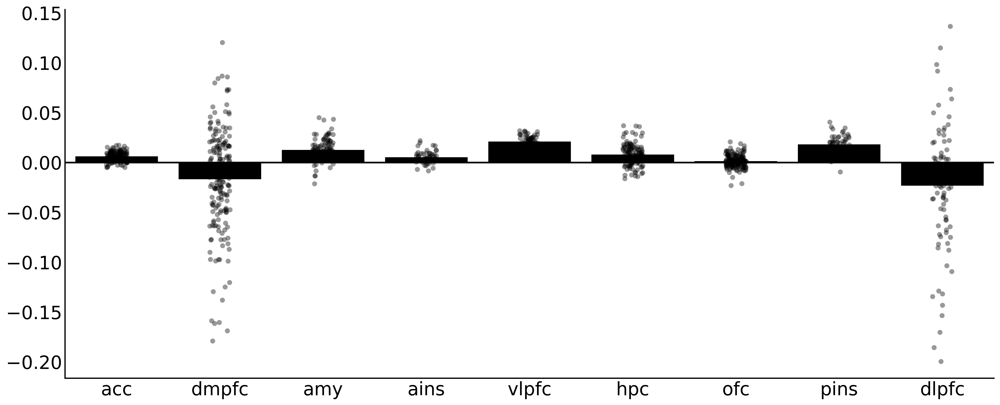

In [30]:
plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),dpi=400)

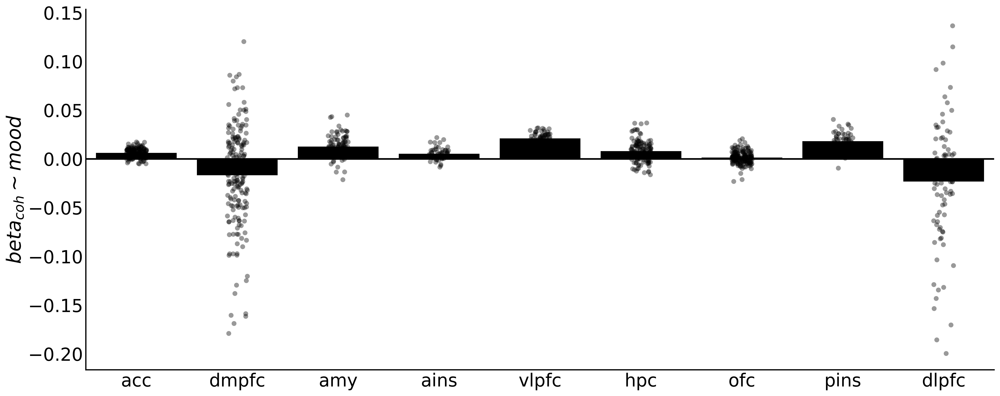

In [31]:
ylabel = fr'${band}_{{coh}} \sim mood$'
# fig_save_dir = '/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/results/single-electrode-regressions/'
fig_id = f'{band}_beta_mood_mlm_barplot.pdf'


plot_roi_model_results(fit_results,'region_type','norm_mood',figsize=(20,8),color='k',
                       ylabel=ylabel,save_fig=True,save_dir=save_dir,fig_id=fig_id,dpi=400)


# plot_roi_model_results(fit_results,'region_type','cpe',bar_order = plot_pairs,figsize=(12,4),color='k')



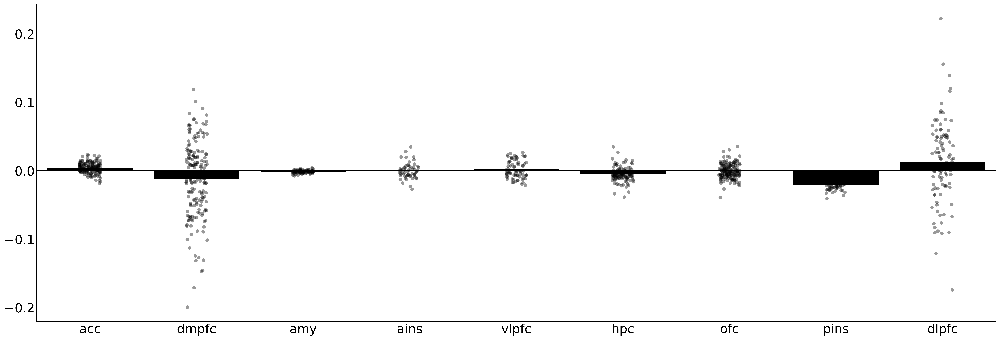

In [34]:
plot_roi_model_results(fit_results,'region_type','cpe_t1',figsize=(30,10),color='k')


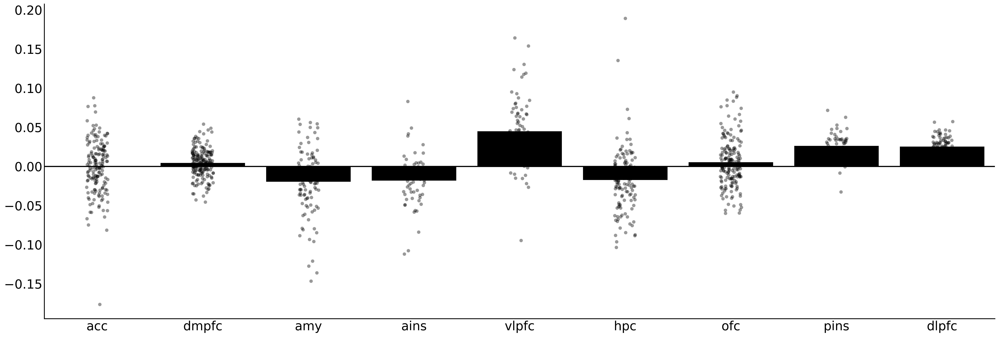

In [35]:
plot_roi_model_results(fit_results,'region_type','norm_mood:cpe_t1',figsize=(30,10),color='k')


# Mood Weights BDI Correlation

In [36]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data.norm_mood)
#     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
#     print(f'{roi} pearsonr',rho,rho_p)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
#     if rho_p <= bonferr_alpha:
#         sig_bdi_rois.append(roi)
#     if rho_p < bonferr_alpha:
    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr -0.012992052666624926 0.8676530746900165
dmpfc pearsonr -0.34401235853449097 9.65882078590697e-07
amy pearsonr -0.3013614830496465 0.0020840762650160844
ains pearsonr -0.2887332138693388 0.029389887417716958
vlpfc pearsonr -0.08647677951342798 0.4606871623650381
hpc pearsonr -0.32061423733229744 0.00028301136105406827
ofc pearsonr -0.02998644528676271 0.6902835698535636
pins pearsonr 0.391509976611075 0.0023731428196593525
dlpfc pearsonr -0.19090079817574715 0.06386512336115725


In [37]:
sig_rho

[('dmpfc', -0.34401235853449097, 9.65882078590697e-07),
 ('amy', -0.3013614830496465, 0.0020840762650160844),
 ('ains', -0.2887332138693388, 0.029389887417716958),
 ('hpc', -0.32061423733229744, 0.00028301136105406827),
 ('pins', 0.391509976611075, 0.0023731428196593525)]

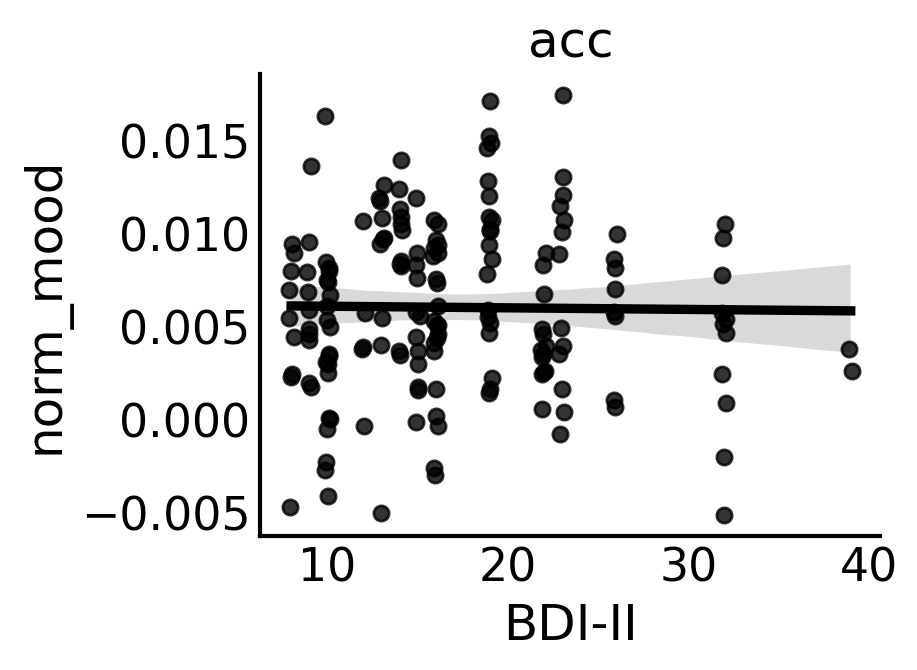

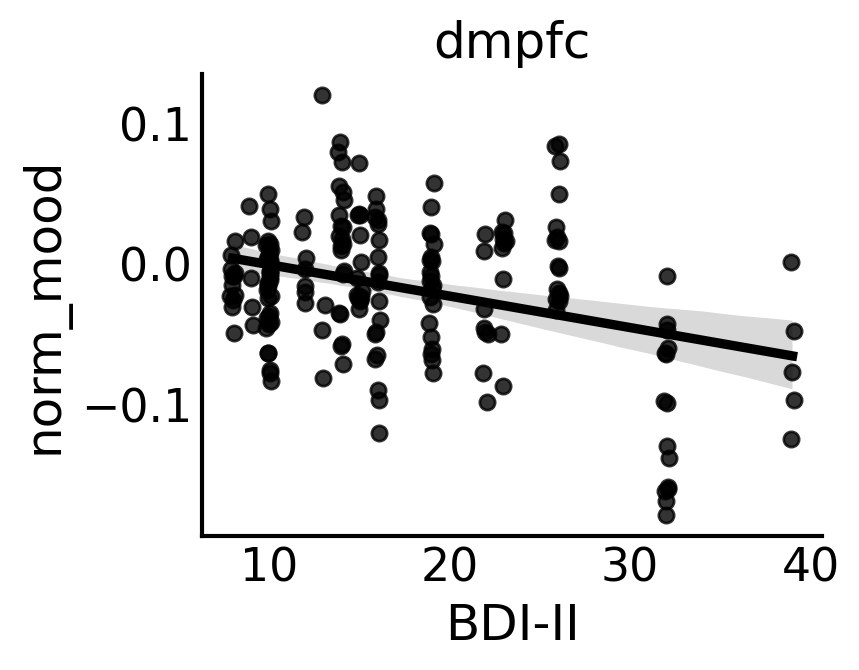

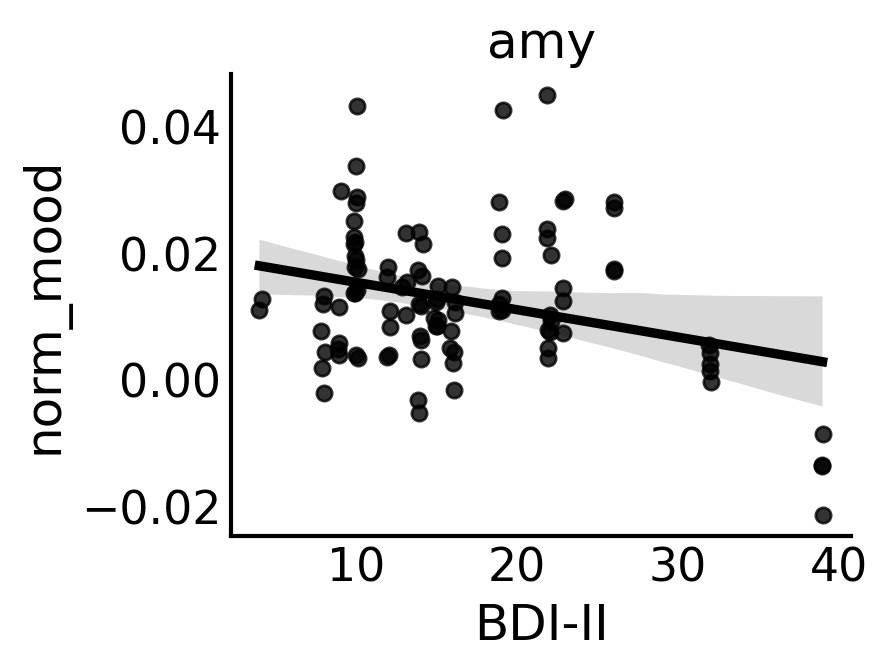

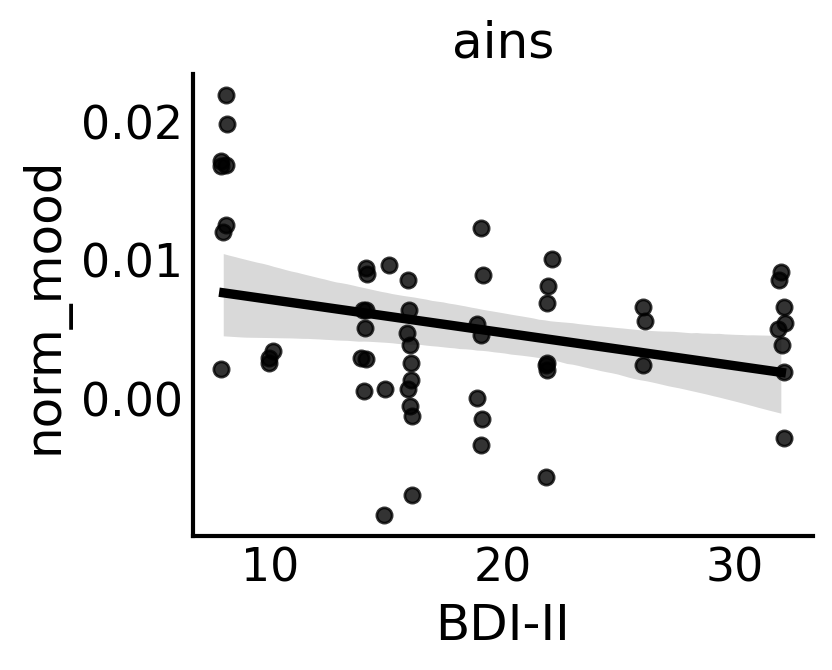

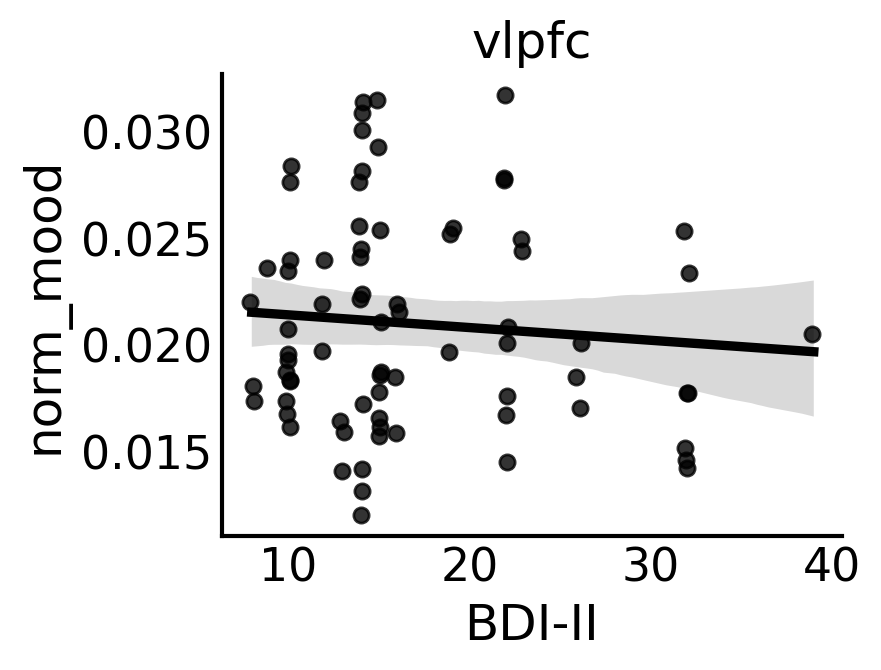

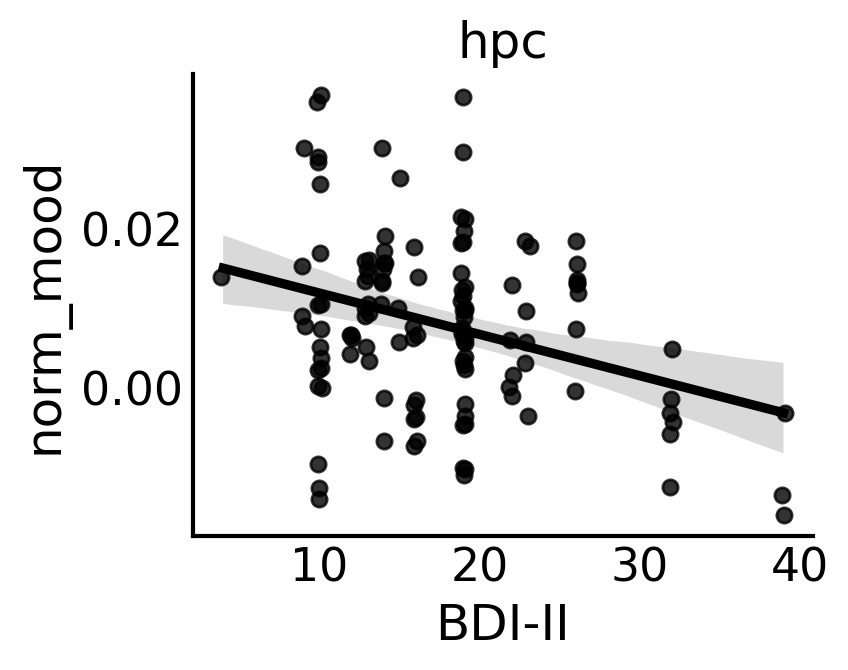

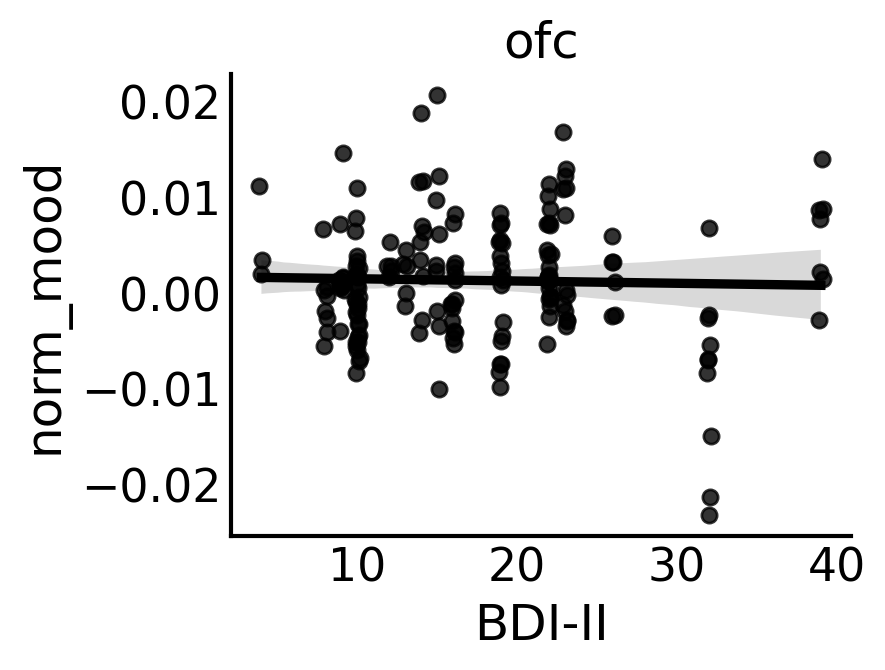

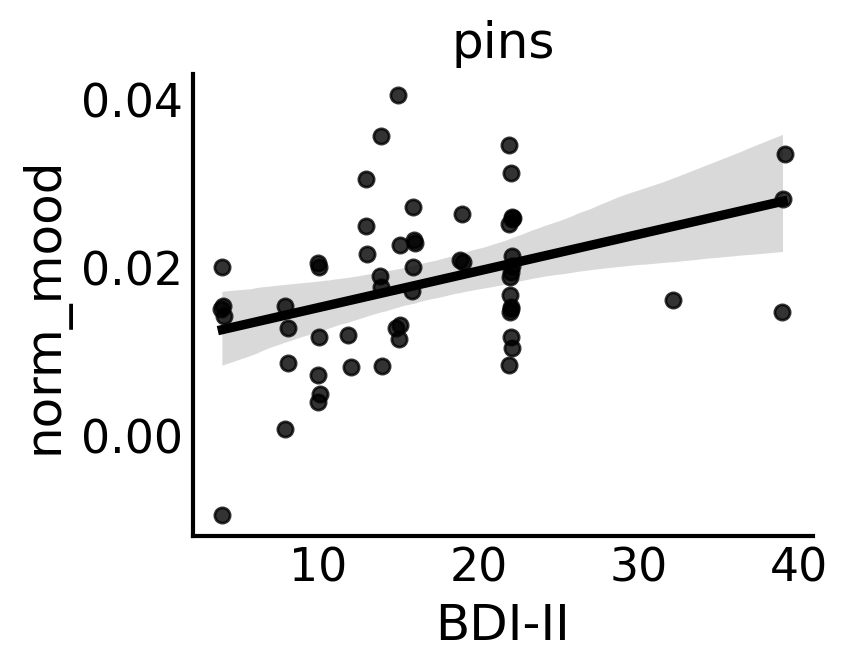

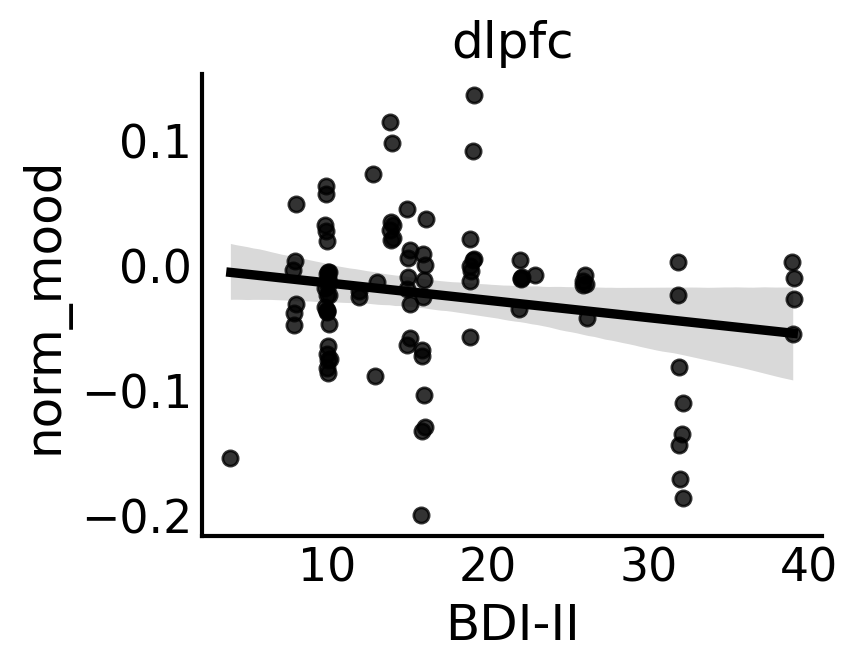

In [38]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [39]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.norm_mood.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        20:41:25                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.4399      0.829     19.823     

# CPE Weights BDI Correlation

In [40]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data.cpe_t1)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))

    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr 0.01959416468069404 0.8015553636204692
dmpfc pearsonr -0.000507255471765708 0.9944138638065453
amy pearsonr -0.2960967074191132 0.0025141103469552366
ains pearsonr -0.27217698368571297 0.04053935825081696
vlpfc pearsonr 0.05807537423351698 0.6206579532710138
hpc pearsonr -0.21642749052649218 0.015764859226709758
ofc pearsonr 0.0024370971853468447 0.9741708028986262
pins pearsonr 0.3696274876050088 0.004295473588058934
dlpfc pearsonr -0.14698347783996402 0.15520486615282508


In [41]:
sig_rho

[('amy', -0.2960967074191132, 0.0025141103469552366),
 ('ains', -0.27217698368571297, 0.04053935825081696),
 ('hpc', -0.21642749052649218, 0.015764859226709758),
 ('pins', 0.3696274876050088, 0.004295473588058934)]

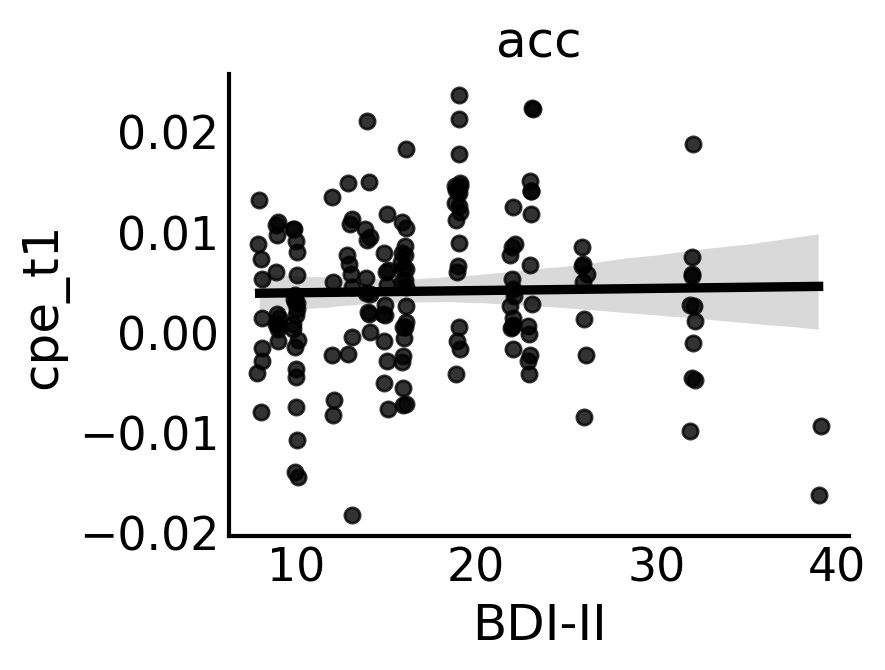

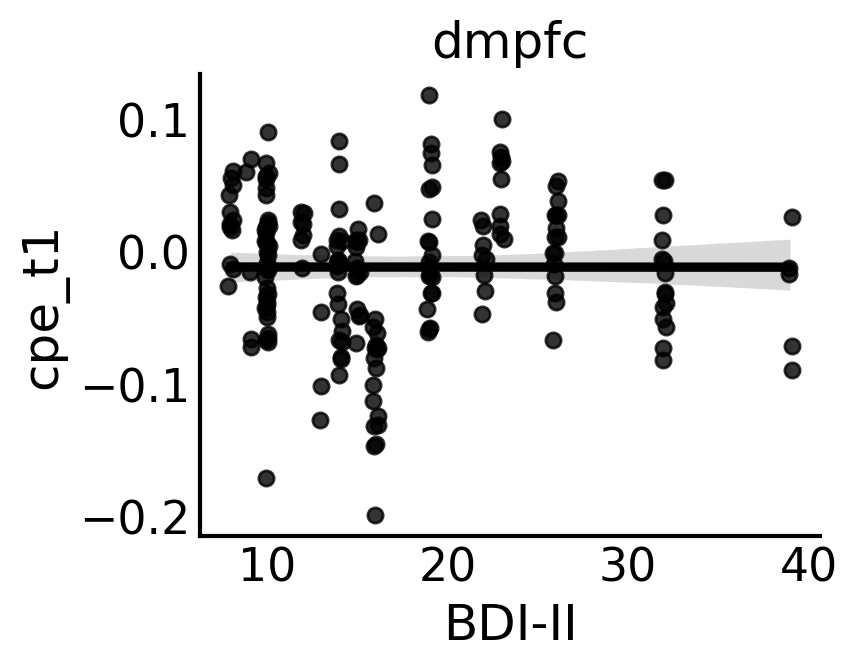

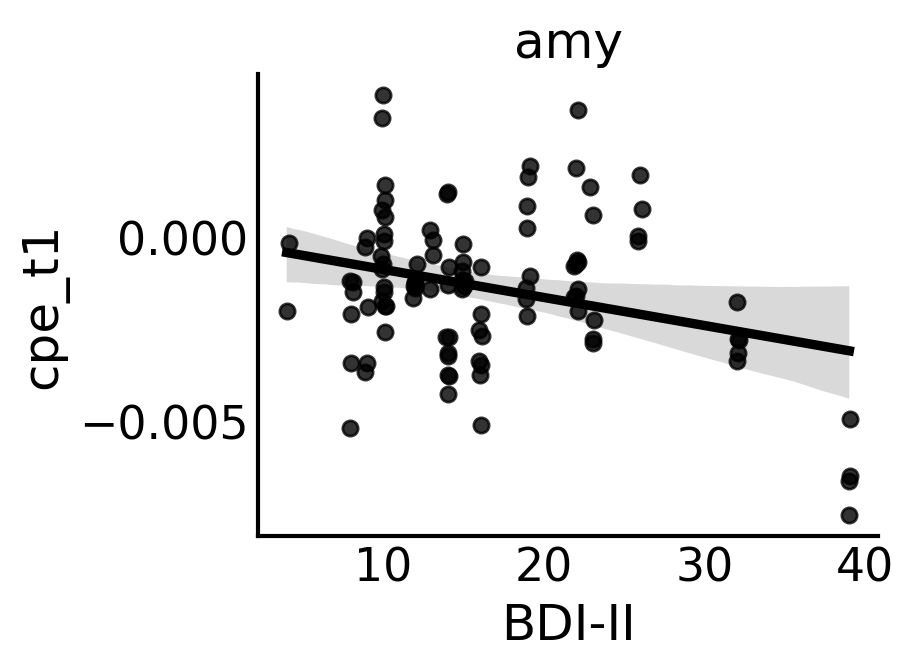

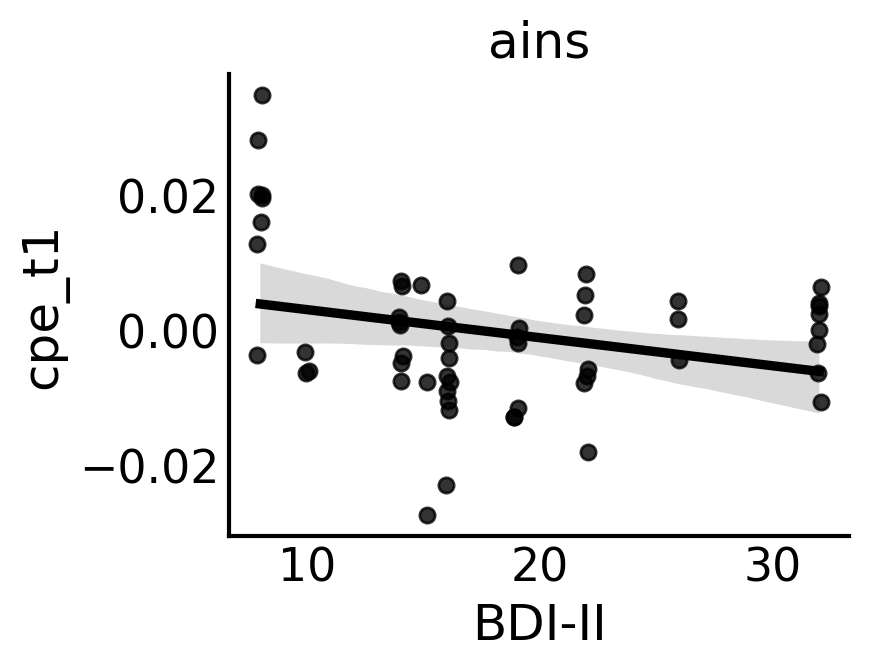

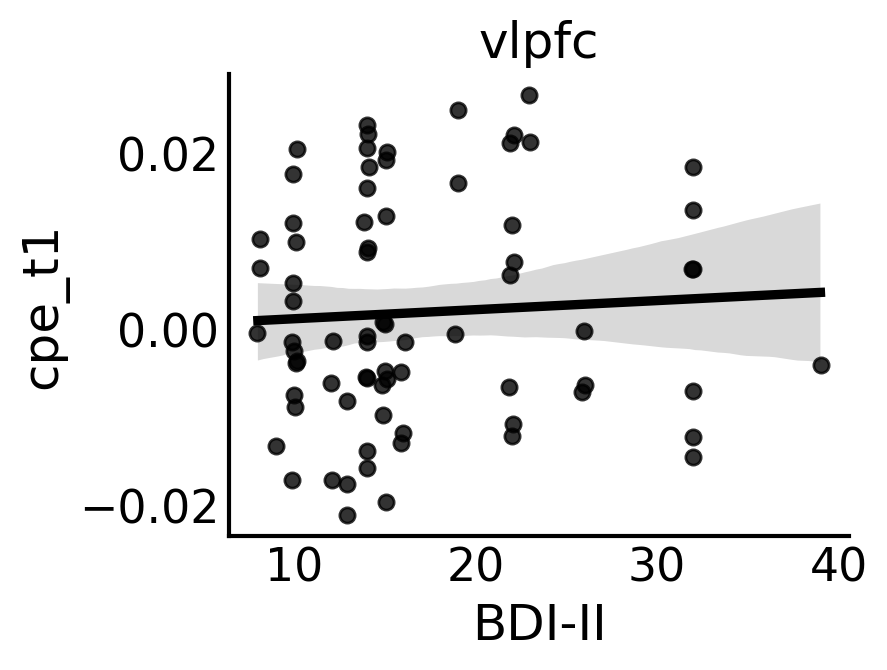

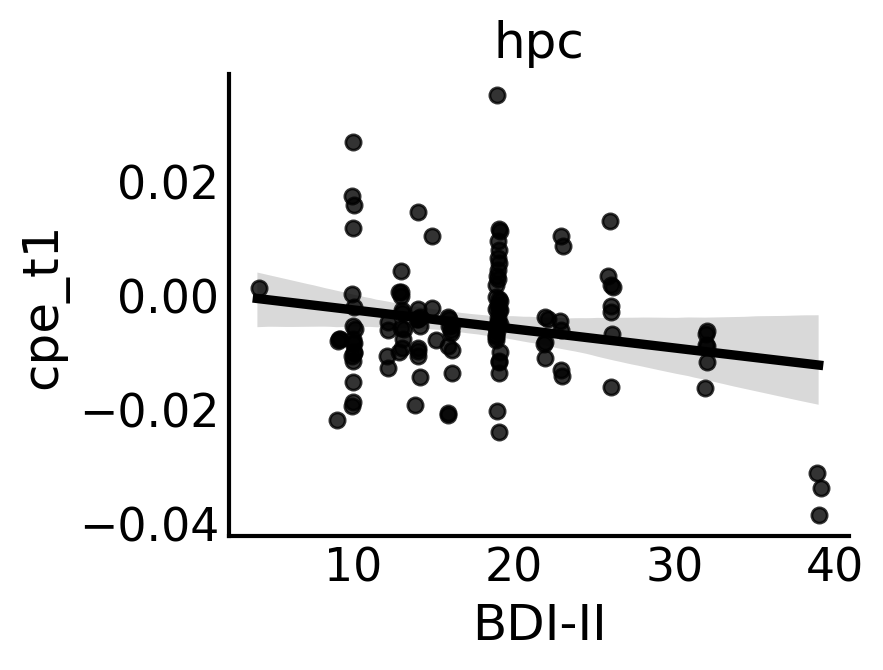

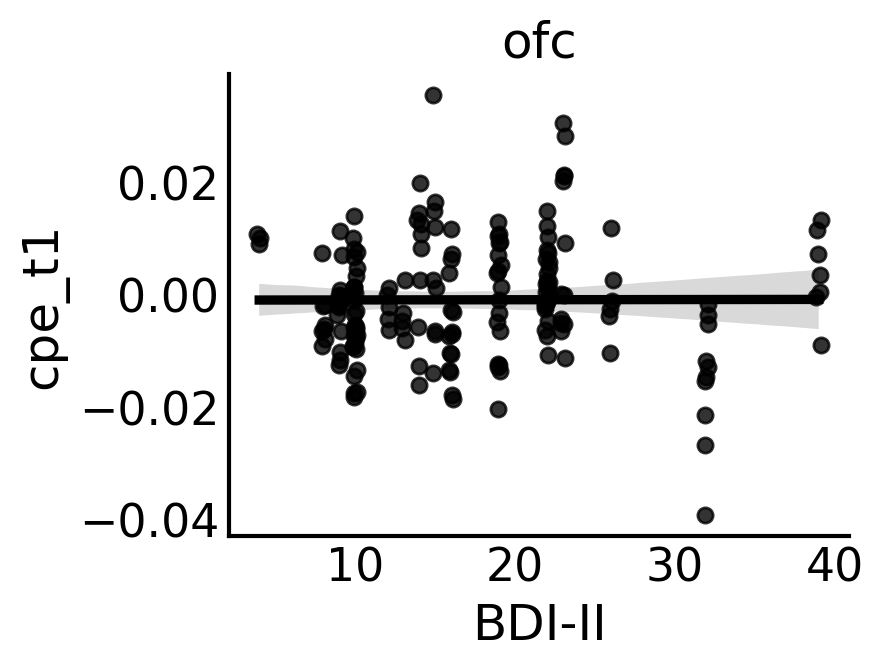

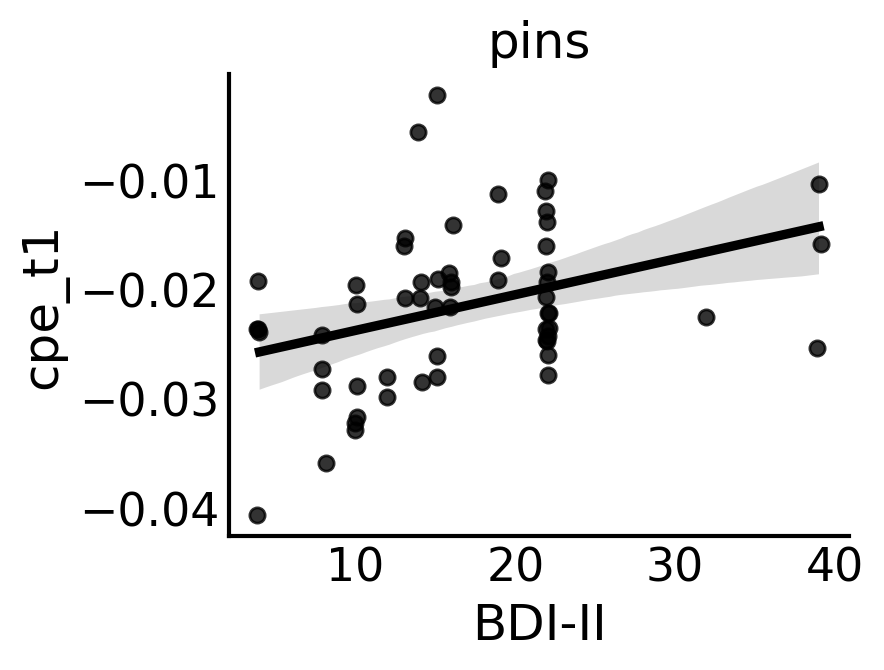

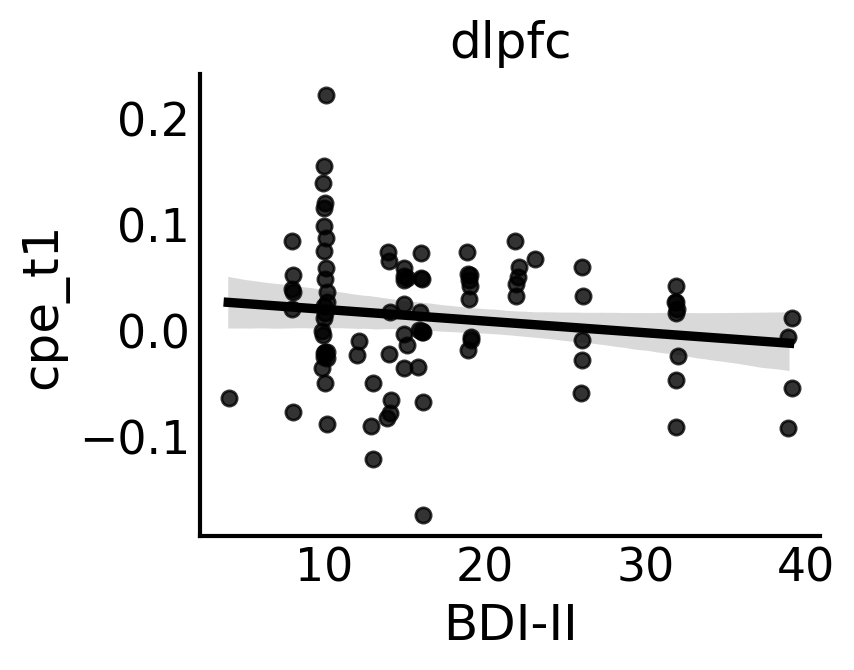

In [42]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [43]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df.cpe_t1.values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        20:42:05                                         
No. Iterations:                    28                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.2006      0.548     29.565     

# Mood-CPE Interaction BDI Correlation

In [44]:
# CHECK BDI CORRELATION

rho_data = []
sig_rho = []

# BDI CORRELATIONS
for roi in fit_results.region_type.unique().tolist():
    temp_data = fit_results[fit_results.region_type==roi]
    rho,rho_p     = pearsonr(temp_data.bdi,temp_data['norm_mood:cpe_t1'])
#     rho,rho_p     = pearsonr(roi_temp_data.bdi,roi_temp_data.elec_bCPE)
#     print(f'{roi} pearsonr',rho,rho_p)
    rho_data.append(pd.DataFrame({'roi':roi,'rho':rho,'rho_p':rho_p},index=[0]))
#     if rho_p <= bonferr_alpha:
#         sig_bdi_rois.append(roi)
#     if rho_p < bonferr_alpha:
    if rho_p < 0.05:
        sig_rho.append((roi,rho,rho_p))
    print(f'{roi} pearsonr',rho,rho_p)
rho_data = pd.concat(rho_data).reset_index(drop=True)


acc pearsonr 0.09907231329224214 0.20272845648748228
dmpfc pearsonr 0.37318234689723123 9.03683427352606e-08
amy pearsonr -0.23374646302998642 0.018055235636449677
ains pearsonr 0.20178323893404138 0.1322701837055427
vlpfc pearsonr 0.15575488995320594 0.182078981782021
hpc pearsonr -0.13918768643866927 0.12313531244545675
ofc pearsonr 0.09585812478550124 0.20179615804814274
pins pearsonr 0.015260929318013344 0.9094753749190291
dlpfc pearsonr 0.014769354672579185 0.8870358542696122


In [45]:
sig_rho

[('dmpfc', 0.37318234689723123, 9.03683427352606e-08),
 ('amy', -0.23374646302998642, 0.018055235636449677)]

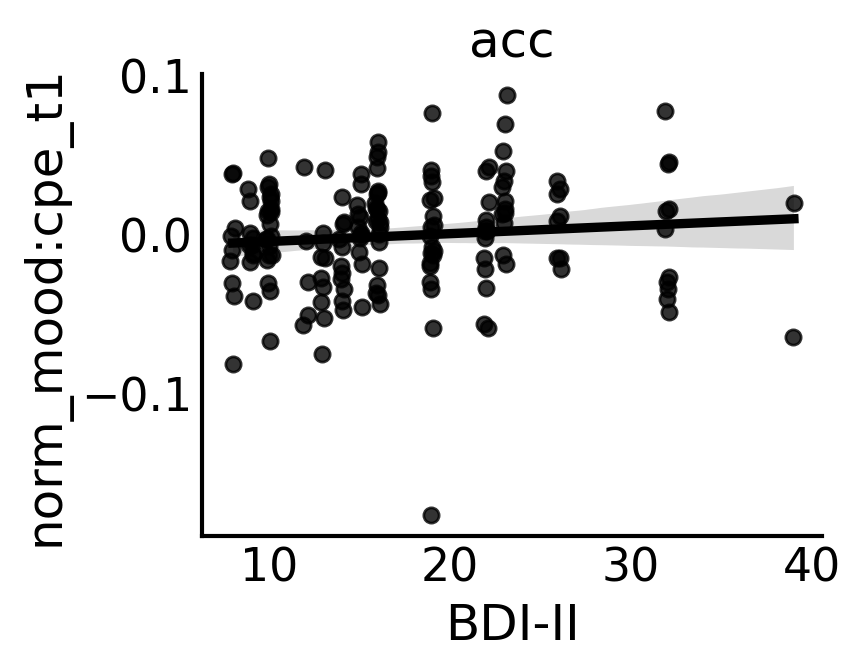

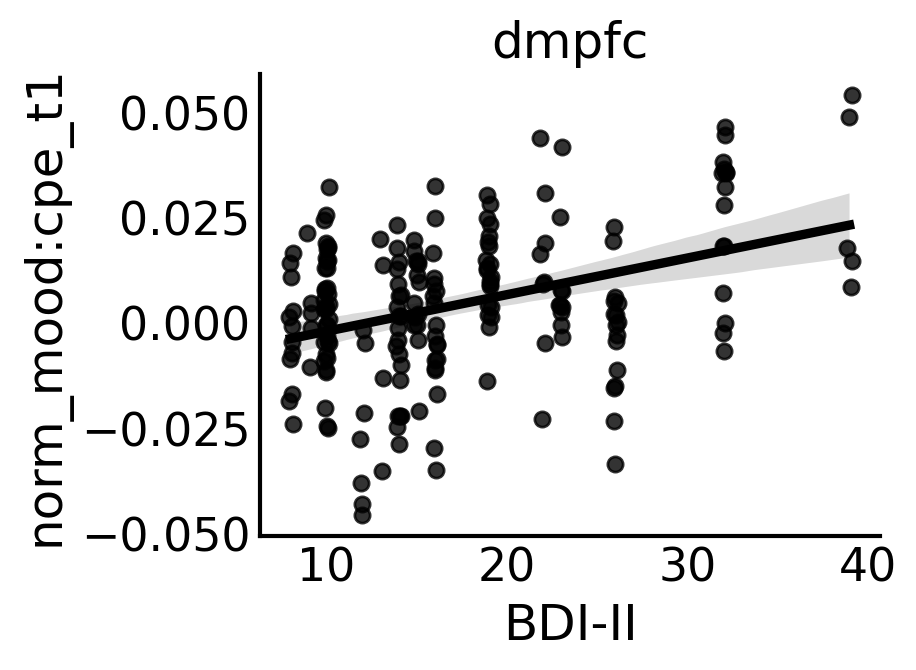

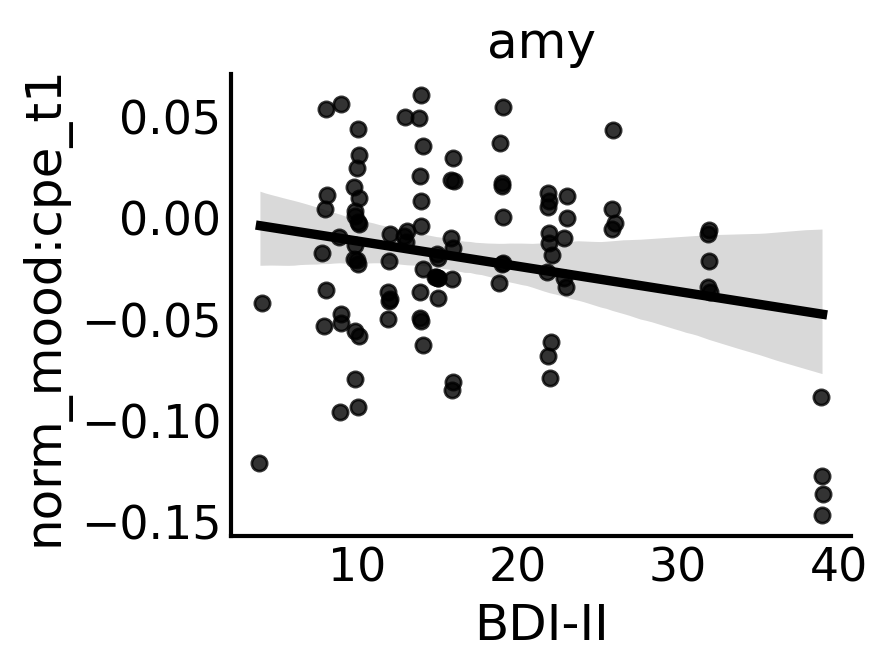

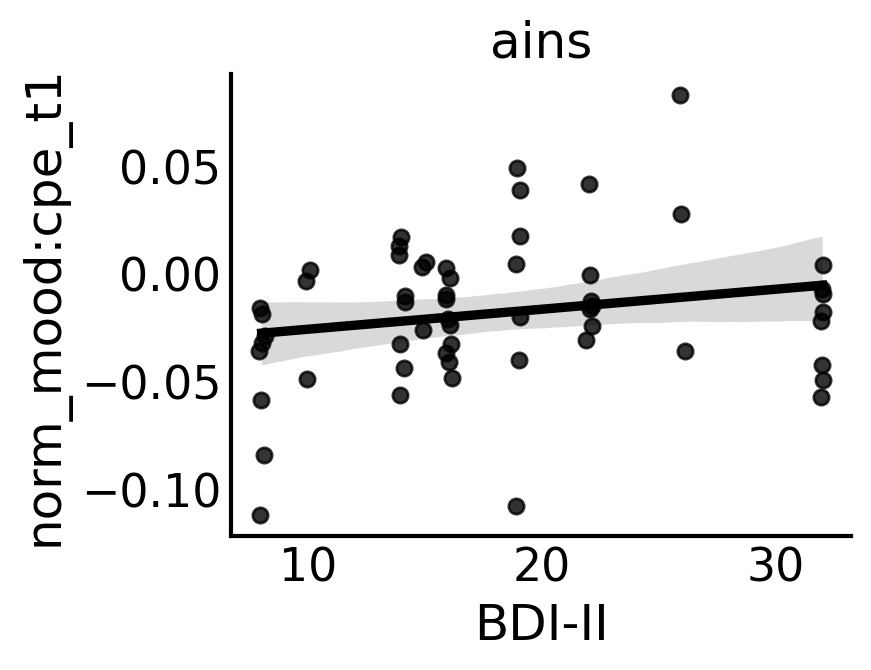

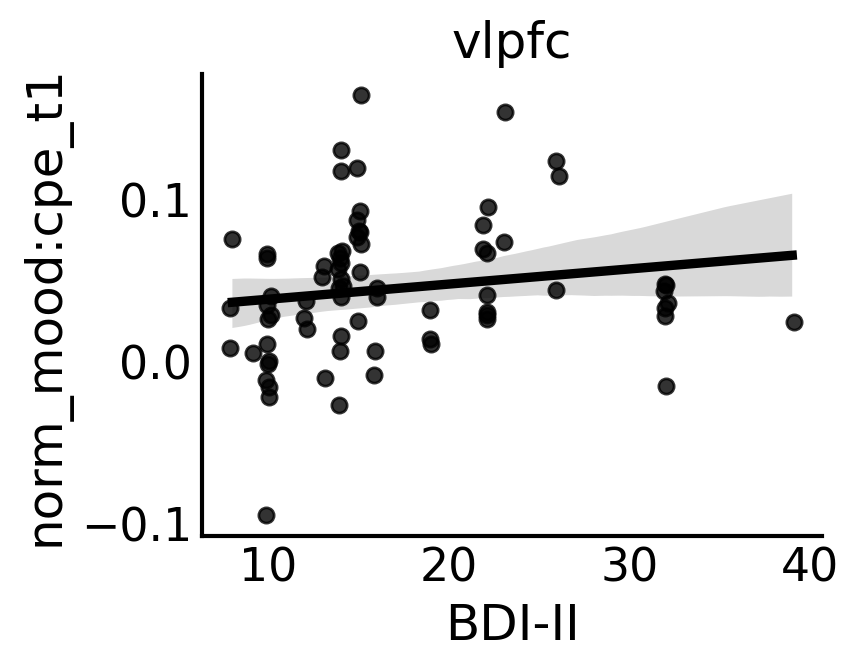

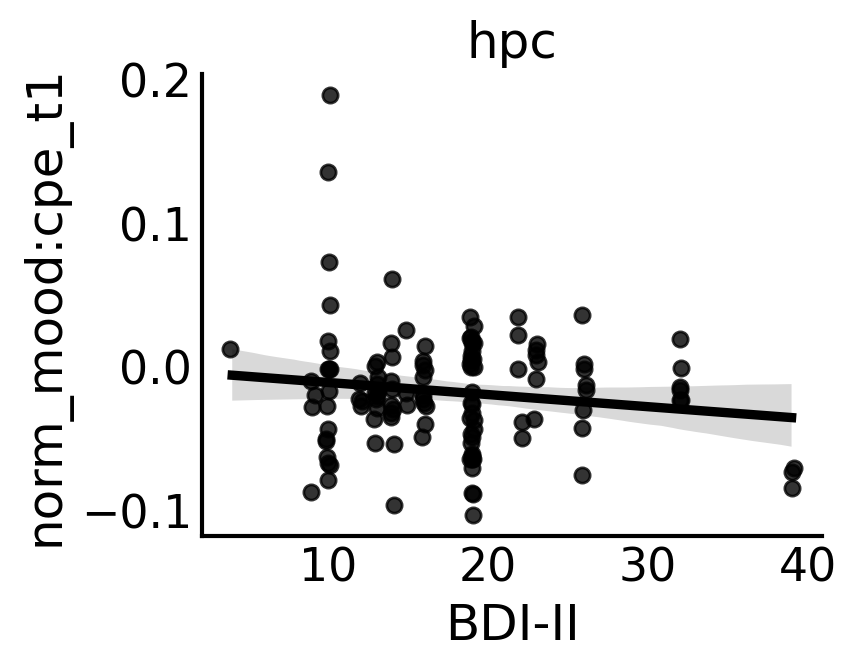

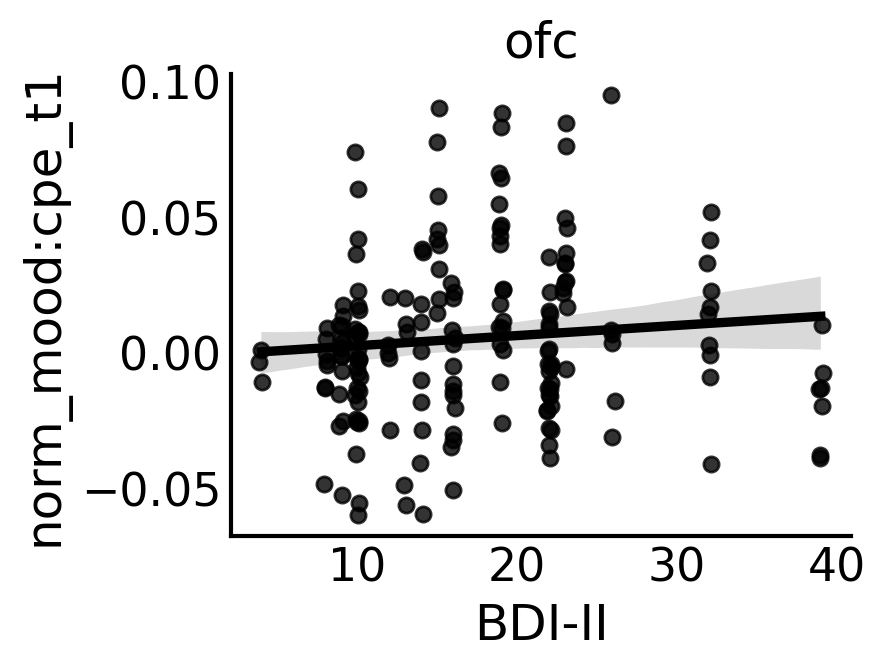

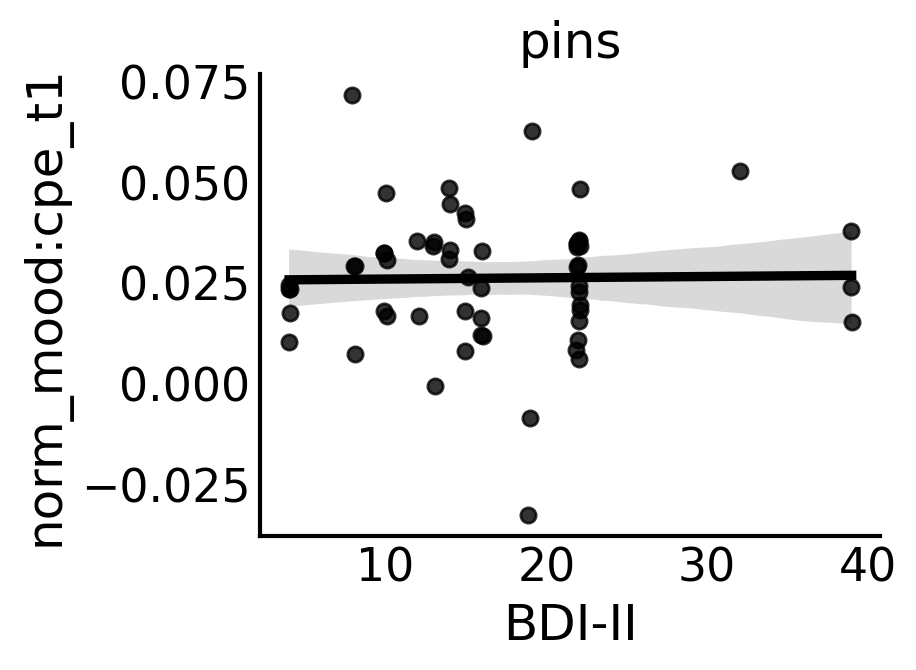

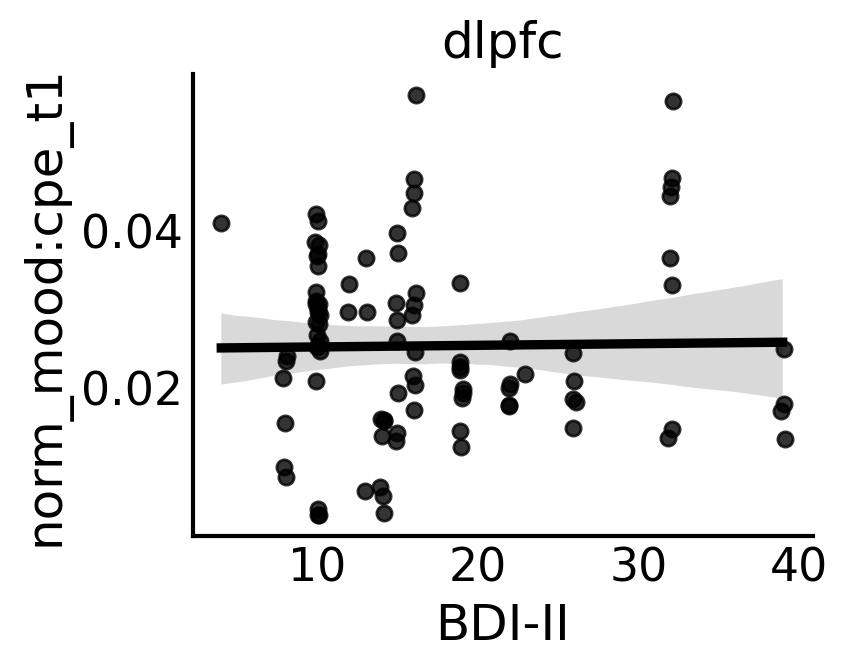

In [46]:

sns.set_context("talk",rc={'axes.linewidth': 1.5})

for roi in fit_results.region_type.unique().tolist():
    
    temp_data = fit_results[fit_results.region_type==roi]

#     rho   = rho_data[rho_data.roi == roi].round_rho.values[0]
#     rho_p = rho_data[rho_data.roi == roi].round_p.values[0]
    
        
    fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200)

    sns.regplot(data=temp_data,x='bdi',y='norm_mood:cpe_t1',scatter=True,ci=95,
                fit_reg=True,color = 'k',x_jitter = 0.15,scatter_kws={'s':30}) #034975
    
#     sns.scatterplot(data = roi_temp_data.groupby(['subj_id']).agg('mean'),x='bdi',
#                     y='decisionCPE',color = '#00467e',edgecolor=None,alpha=0.8)
    
#     plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 
    plt.xlabel('BDI-II')
#     plt.xlim([0,40])
    
    plt.tick_params(length=0) 
#     plt.ylabel('beta'+r'$beta_{{{zpow}}}$'+' cpe encoding')
#     plt.ylabel(fr'${band}_{{{zpow}}} \sim cpe$')

#     plt.text(np.max(roi_temp_data.bdi)-8,
#              np.round(np.max(roi_temp_data.groupby(['subj_id']).agg('mean').elec_bCPE),3)-0.003,
#              r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',color='k',fontsize=12)
#              color='#00467e',fontsize=16)
#     plt.text(0.8,0.8,r'$rho$ = '+f'{rho} \n'+ fr'$p \approxeq $ {rho_p}',
#             verticalalignment='top', horizontalalignment='right',
#             color='k',fontsize=16)

    plt.title(f'{roi}')
    sns.despine()
#     plt.tight_layout()


    
# #     sns.despine()
    
#     plt.savefig(f'{save_dir}/{pair_id}_{rho}_{rho_p}_beta_coh_bdi-cpe-slope.pdf', format='pdf', metadata=None,
#         bbox_inches='tight', pad_inches=0.1,dpi=300,
#         facecolor='auto', edgecolor='auto',
#         backend=None)
    

In [47]:
### robust regression bdi ~ cpe coefficients
rlm_dict = {}

for roi in fit_results.region_type.unique().tolist():
    roi_rlm_df = fit_results[fit_results.region_type == roi]
    rlm = sm.RLM(roi_rlm_df.bdi.values, sm.add_constant(roi_rlm_df['norm_mood:cpe_t1'].values), M=sm.robust.norms.HuberT())
    rlm_results = rlm.fit()
    rlm_dict[roi] = rlm_results
    print(roi)
    print(rlm_results.summary())


acc
                    Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                  167
Model:                            RLM   Df Residuals:                      165
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Sat, 05 Oct 2024                                         
Time:                        20:42:45                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         16.5682      0.482     34.340     